Found some more ambiguous cells in the B cell clusters. try and recluster and check all the labels

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.logging.print_versions()

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/NC_study/scanpy'))

# create a palette for umap
import sys
sys.path.append('/home/jovyan/NC_study/scanpy/scripts')
from tools import cmp
newcmp = cmp()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
adata = sc.read_h5ad('out/adata_combined_v2.h5ad')
adata_raw = sc.read_h5ad('out/adata_combined_raw_v2.h5ad')
adata

AnnData object with n_obs × n_vars = 93971 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Filter out ambiguous

In [3]:
adata = adata[~(adata.obs['celltype']=='ambiguous')]
adata_raw = adata_raw[~(adata_raw.obs['celltype']=='ambiguous')]
adata

View of AnnData object with n_obs × n_vars = 80102 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Recluster

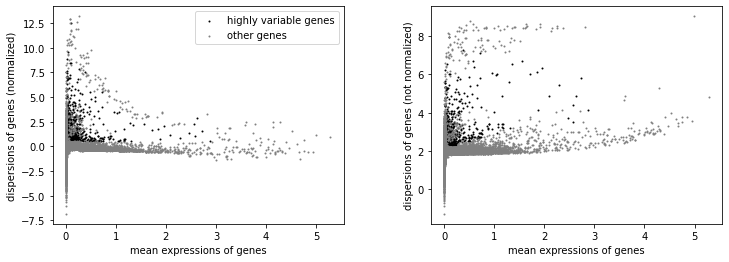

AnnData object with n_obs × n_vars = 80102 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [4]:
adata = adata.raw.to_adata()
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
import re
for i in adata.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJ]', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)
adata.raw = adata
adata

In [5]:
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value = 10)

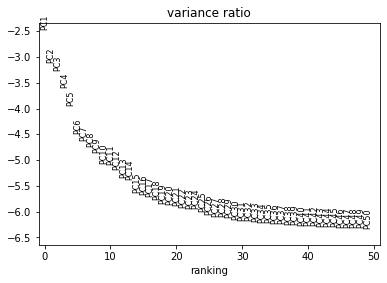

In [6]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

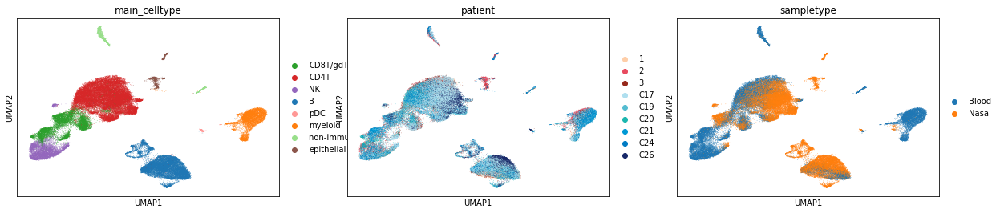

In [7]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient')
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata, color=['main_celltype', 'patient', 'sampletype'])

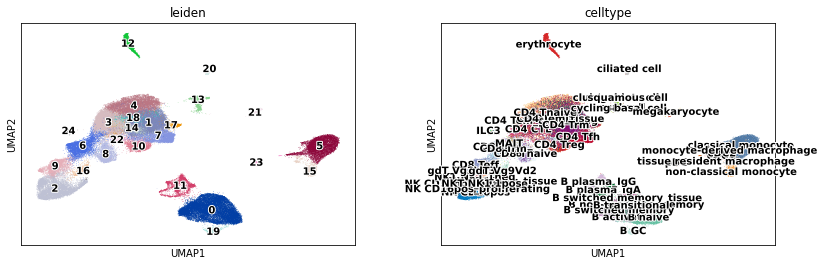

In [8]:
# find clusters
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['leiden', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

## Sub-clustering for fine cell type annotation

### MNP

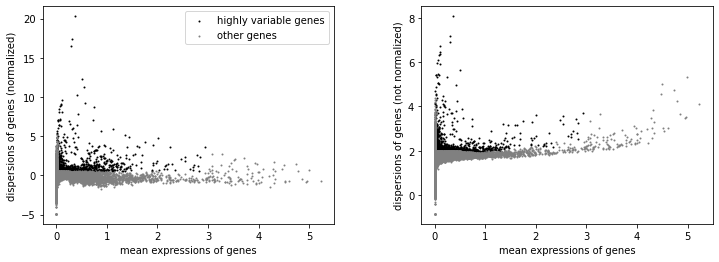

AnnData object with n_obs × n_vars = 7514 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [9]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['5', '15'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [10]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

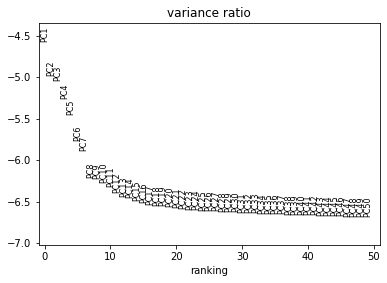

In [11]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

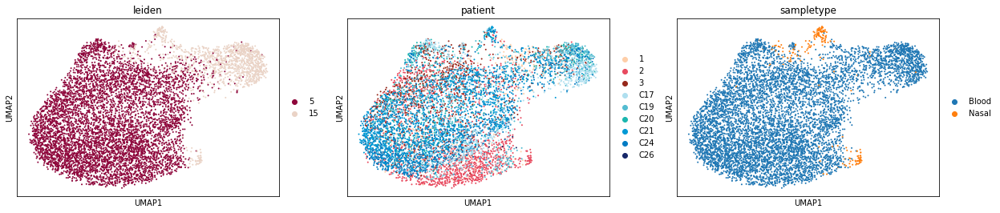

In [12]:
# # run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'])

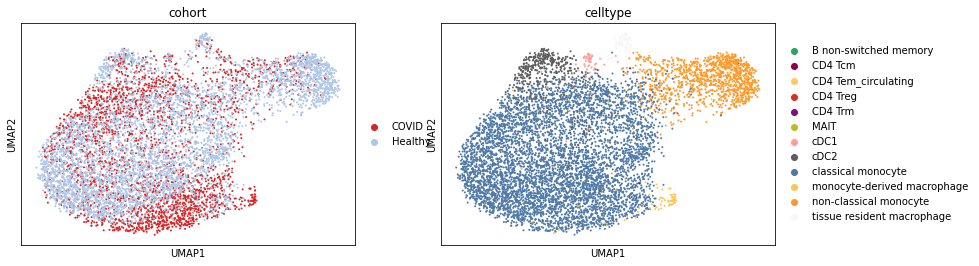

In [13]:
sc.pl.umap(rna_x, color=['cohort', 'celltype'])

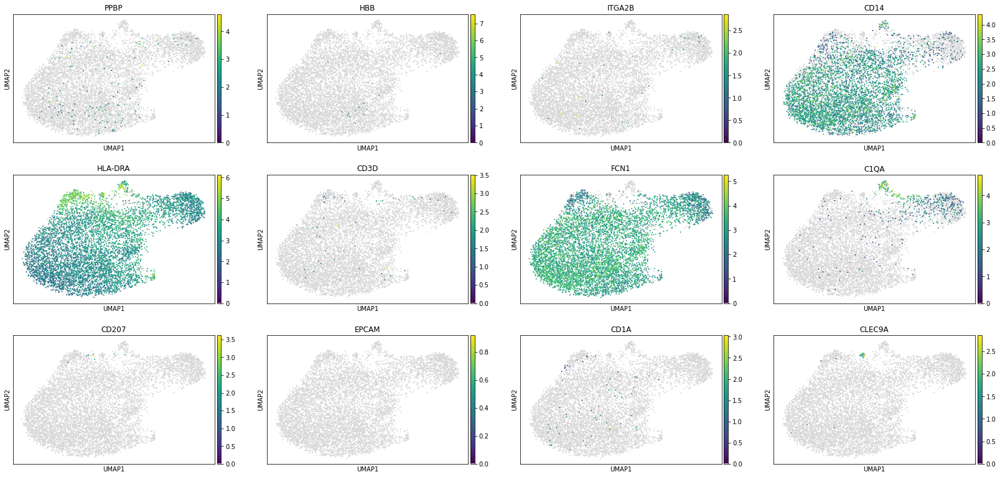

In [14]:
sc.pl.umap(rna_x, color = ['PPBP', 'HBB', 'ITGA2B', 'CD14', 'HLA-DRA', 'CD3D', 'FCN1', 'C1QA', 'CD207', 'EPCAM', 'CD1A', 'CLEC9A'], color_map = newcmp)

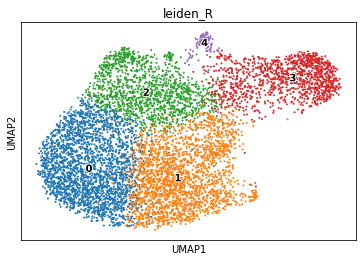

In [15]:
# find clusters
sc.tl.leiden(rna_x, resolution = 0.5, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden_R'], legend_loc ='on data', legend_fontoutline=2)

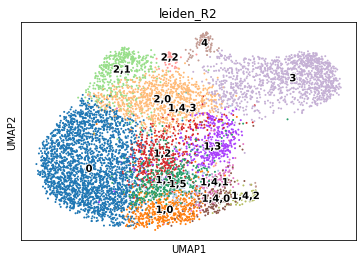

In [30]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['1']), resolution = 1)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R2', ['2']), resolution = 0.5)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R2', ['1,4']), resolution = 0.5)
sc.pl.umap(rna_x, color=['leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

In [31]:
macrophage_signature = {'YS':['MMP9', 'CADM1', 'IRAK1', 'SH3YL1', 'DNAJB6', 'EPCAM', 'ECD', 'PFKP', 'FABP4', 'MS4A7', 'DCAKD', 'GPS1', 'TRNAU1AP', 'AGPAT3', 'DNAJB6', 'GPS1', 'SAE1', 'FOSB', 'HOXC4', 'FOLR2', 'GPS1', 'BAZ1B', 'OST4', 'PTPRA', 'PLOD1', 'PHF5A', 'NMD3', 'PLAU', 'CDK2', 'MAPK9', 'GDPD1', 'FBXO30', 'TRNAU1AP', 'MRC1', 'FAM98B', 'CCDC18', 'ANLN', 'CTBP2', 'ACSM3', 'S1PR1', 'PXDN', 'MAN1A1', 'COX6A1', 'SLC43A3', 'CCDC47', 'TNS3', 'PLEKHG5', 'NDUFS4', 'UBE2Z', 'B3GALNT1', 'TBC1D19', 'MRTO4', 'TRAIP', 'CEP55', 'UTP20', 'STMN1', 'STAB1', 'SMARCAD1', 'CTSB', 'MAN2B2', 'PTN', 'SLC30A7', 'LHFPL2', 'RALGDS', 'ABCB8', 'NDRG3', 'PEG3', 'NUF2', 'SENP5', 'SLC35D1', 'RILPL1', 'NDUFV1', 'AHSA1'],
'HSC':[' TTLL3', 'GDA', 'GPR35', 'IFITM2', 'XDH', 'CD74', 'MBP', 'S100A8', 'F12', 'PID1', 'CCR2', 'LILRA4', 'PNRC1', 'ARHGEF37', 'UBP1', 'TREML4', 'POLR1E', 'CYTIP', 'TEAD1', 'GZF1', 'PLAC8', 'RASGRP4', 'KLF13', 'PLBD1', 'MPG', 'DENND1C', 'SMPDL3A', 'DGKG', 'AL121845.2', 'PTHLH', 'AHNAK', 'KYNU', 'RAC2', 'AC069257.4', 'SELL']}

In [32]:
def geneset_score(self, genesets, groupby, figsize=(3, 4), cmap = 'Blues'):
    import seaborn as sns
    for s in genesets:
        sc.tl.score_genes(self, genesets[s], use_raw = True, score_name= str(s)+'_score')
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s)+'_score' for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s)+'_score' for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s)+'_score' for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = True, row_cluster = True)
    print(g)

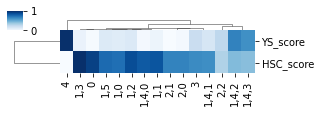

In [33]:
geneset_score(rna_x, macrophage_signature, 'leiden_R2', (4.5,1.5))

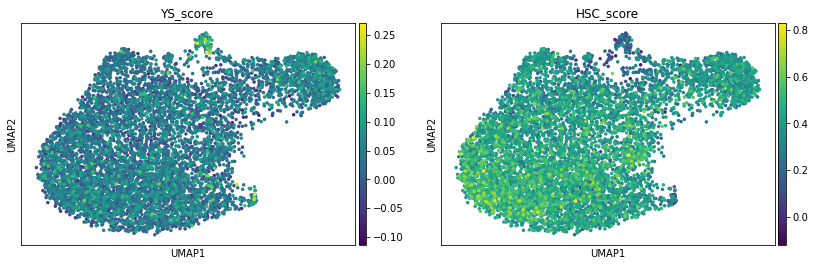

In [34]:
sc.pl.umap(rna_x, color=['YS_score', 'HSC_score'], size = 50, color_map = 'viridis')

... storing 'celltype' as categorical


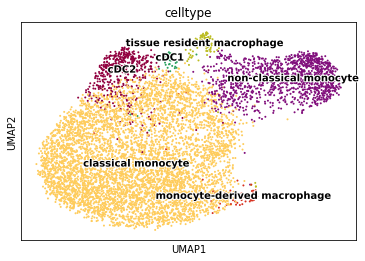

In [36]:
new_dict1 = {
'0':'classical monocyte',
'1,0':'classical monocyte',
'1,1':'classical monocyte',
'1,2':'classical monocyte',
'1,3':'classical monocyte',
'1,4,0':'classical monocyte',
'1,4,1':'classical monocyte',
'1,4,2':'monocyte-derived macrophage',
'1,4,3':'monocyte-derived macrophage',
'1,4':'classical monocyte',
'1,5':'classical monocyte',
'2,0':'classical monocyte',
'2,1':'cDC2',
'2,2':'cDC1',
'3':'non-classical monocyte',
'4':'tissue resident macrophage'}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R2']]
sc.pl.umap(rna_x, color=['celltype'], legend_loc ='on data', legend_fontoutline=2)

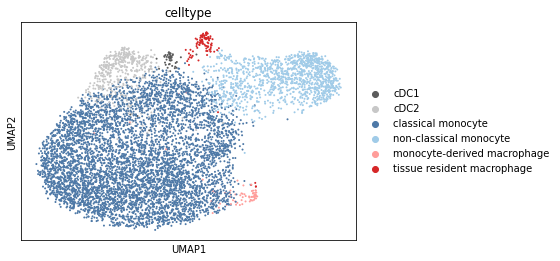

In [37]:
# reorder the categories
rna_x.obs['celltype'] = rna_x.obs['celltype'].cat.reorder_categories(['cDC1', 
                                                'cDC2', 
                                                'classical monocyte',
                                                'non-classical monocyte', 
                                                'monocyte-derived macrophage',
                                                'tissue resident macrophage'])
sc.pl.umap(rna_x, color = 'celltype', palette = ['#5c5c5c','#c7c7c7', # cDC1, cDC2
                                                   '#4e79a7','#a0cbe8', # classical, non-classical
                                                   '#ff9d9a','#d62728']) # monocyte, tissue-res

... storing 'celltype' as categorical


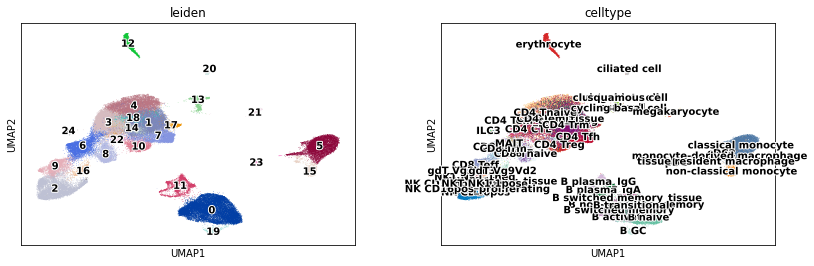

In [38]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

### NK cell/T cell

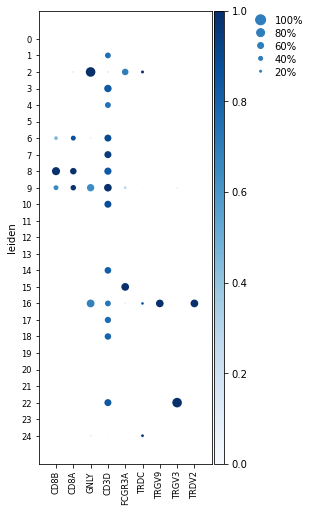

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.15, 0, 0.2, 0.5, 0.25])

In [41]:
sc.pl.dotplot(adata, ['CD8B', 'CD8A', 'GNLY', 'CD3D', 'FCGR3A', 'TRDC', 'TRGV9', 'TRGV3', 'TRDV2'], groupby='leiden', standard_scale = 'var', color_map = 'Blues')

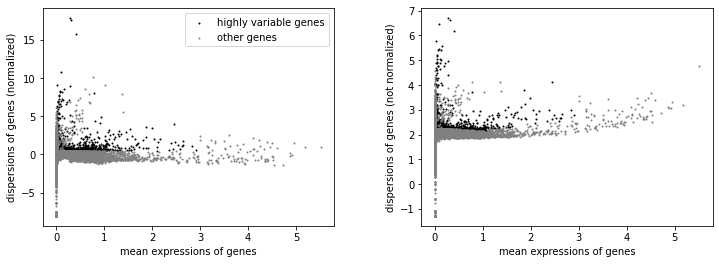

AnnData object with n_obs × n_vars = 31423 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [42]:
# subset to CD4T cells
rna_ = adata[adata.obs['leiden'].isin(['1', '3', '4', '7', '10', '14', '17', '18', '22'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
import re
for i in rna_x.var.index:
    if re.search('^TR[AB][VDJ]', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [43]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

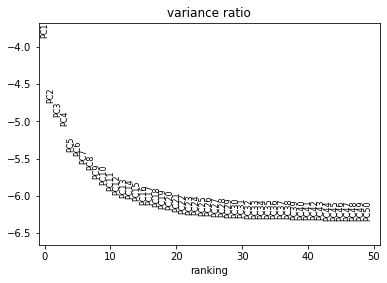

In [44]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

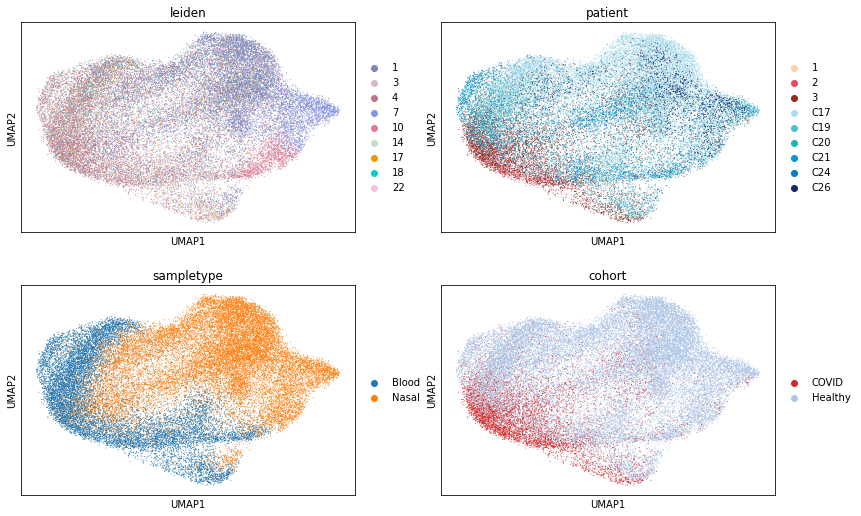

In [45]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype', 'cohort'], ncols =2, )

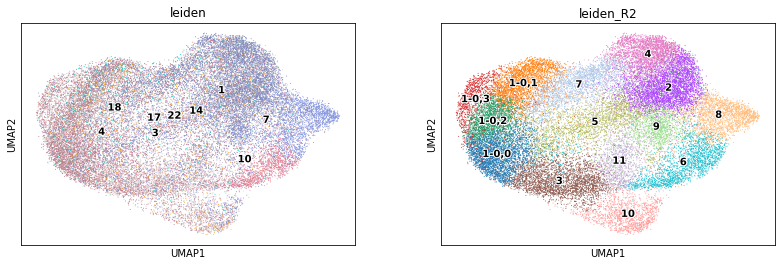

In [55]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 1.5)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['1', '0']), resolution = .8)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

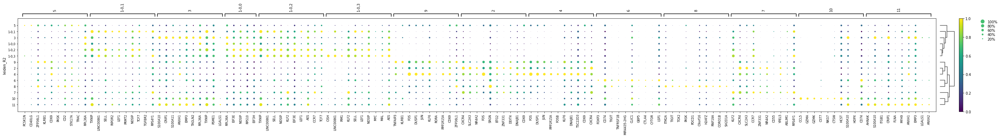

In [56]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R2')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

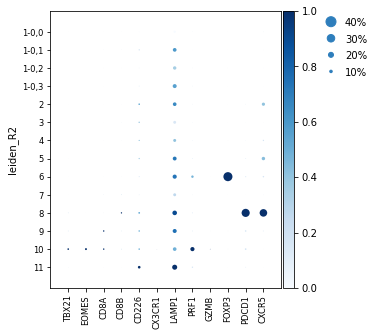

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.199999999999999, 0, 0.2, 0.5, 0.25])

In [60]:
sc.pl.dotplot(rna_x, ['TBX21', 'EOMES', 'CD8A', 'CD8B', 'CD226', 'CX3CR1', 'LAMP1', 'PRF1', 'GZMB', 'FOXP3', 'PDCD1', 'CXCR5',], groupby = 'leiden_R2',standard_scale = 'var', color_map = 'Blues')

In [58]:
Kumar_Trm_signature = {
    'CD69+Trm':['CA10','ITGAE1','ITGAE','IL2','IL10','CXCR6','CXCL13','KCNK5','RGS1','CRTAM','DUSP6','PDCD1','IL23R'],
    'CD69-Tem':['STK38','TTC16','SELL','KLF3','KLF2','D4S234E','SBK1','FAM65B','TTYH2','NPDC1','KRT72','S1PR1','SOX13','KRT73','TSPAN18','PTGDS','RAP1GAP2','CX3CR1']}
Mackay_Trm_signature={
    'Trm':['INSIG1', 'DDX3X', 'DHCR24', 'PPP1R16B', 'KLF6', 'BTG2', 'CXCR6', 'FOSB', 'JUN', 'HSPA5', 'NEDD4', 'PLK3', 'STARD4', 'TNFAIP3', 'B4GALNT4', 'IRF4', 'CISH', 'MAPKAPK3', 'SIK1', 'PYGL', 'CTNNA1', 'ODC1', 'PER1', 'DUSP1', 'ATF3', 'LDLRAD4', 'JUNB', 'NFKBID', 'FOSL2', 'RGS2', 'NR4A2', 'DGAT1', 'ARRDC3', 'FRMD4B', 'NR4A1', 'GPR171', 'SMIM3', 'EYA2', 'GPR55', 'AL662899.4', 'CSRNP1', 'TRAF4', 'ZFP36', 'GLRX', 'DUSP5', 'LITAF', 'GADD45B', 'IFNG', 'OSGIN1', 'ABI3', 'EGR1', 'HILPDA', 'SKIL', 'RNF149', 'HMGCS1', 'P4HB', 'PNRC1', 'GPR34', 'PPP1R15A', 'ITGAE', 'P2RY10', 'EHD1', 'DUSP6', 'XCL2', 'SPSB1', 'ISG20', 'INPP4B', 'NEURL3', 'HPGDS', 'RHOB', 'VDAC1', 'LAD1', 'FOS', 'CDH1', 'CD69', 'QPCT', 'HSPD1'],
    'Tcm/Tem':['HBA2', 'C19orf38', 'SNX10', 'HAAO', 'POGK', 'SBK1', 'KLF2', 'BCL9L', 'THAP7', 'ASRGL1', 'ELMO1', 'HEXB', 'RACGAP1', 'CXCR4', 'CDC25B', 'LFNG', 'S1PR5', 'ARHGAP26', 'MPND', 'KCNAB2', 'ATP1B3', 'S1PR4', 'TMEM71', 'KBTBD11', 'EMB', 'MS4A4A', 'GRAMD4', 'EHD3', 'KCNN4', 'TCF7', 'MS4A4A', 'PAQR7', 'FAM89B', 'LYST', 'GLIPR2', 'EML3', 'S1PR1', 'PIK3R5', 'SETX', 'TXNDC5', 'NCLN', 'STK38', 'ITGA4', 'CCL5', 'CD84', 'KLF3', 'ABTB2', 'TBXA2R', 'LYRM2', 'OBP2B', 'ACP5', 'PODNL1', 'LEF1', 'SH2D1A', 'PHF11', 'TSR3', 'GMFG', 'EOMES', 'GNPDA2', 'PDE2A', 'SIDT1', 'GAB3', 'TXK', 'AVEN', 'ICAM2', 'KLHL6', 'SAMHD1', 'SMPDL3B', 'TTC7B', 'C5orf30', 'ATP10D', 'ST3GAL1', 'VOPP1', 'PCED1B', 'DOCK2', 'ITGB1', 'FAM117A', 'IL10RA', 'LPIN1', 'RBM43', 'ARHGEF18', 'RASA3', 'ABHD8', 'FAM49A', 'RASGRP2', 'B3GAT3', 'PRKCQ', 'XRN2']}

In [59]:
for gs in Kumar_Trm_signature:
    sc.tl.score_genes(rna_x, Kumar_Trm_signature[gs], score_name = str(gs)+'_score', use_raw=True)
for gs in Mackay_Trm_signature:
    sc.tl.score_genes(rna_x, Mackay_Trm_signature[gs], score_name = str(gs)+'_score', use_raw=True)

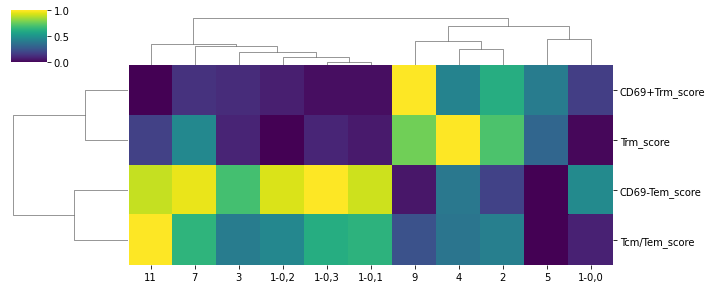

In [61]:
# calculate average enrichment score
test = rna_x[~(rna_x.obs['leiden_R2'].isin(['10','8','6']))]
list1 = list(set(test.obs['leiden_R2']))
subset = test.obs[['leiden_R2'] + [str(gs)+'_score' for gs in Kumar_Trm_signature]+[str(gs)+'_score' for gs in Mackay_Trm_signature]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset['leiden_R2'] == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in Kumar_Trm_signature]+[str(gs)+'_score' for gs in Mackay_Trm_signature]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(10, 4))

In [75]:
# try gene set test with some other gene sets
modules = pd.read_csv('/home/jovyan/NC_study/scanpy/datasets/GSE26928_tcell_genesets.txt', sep = '\t')
for gs in modules.columns:
    sc.tl.score_genes(rna_x, modules[gs], score_name = str(gs)+'_score', use_raw=True)

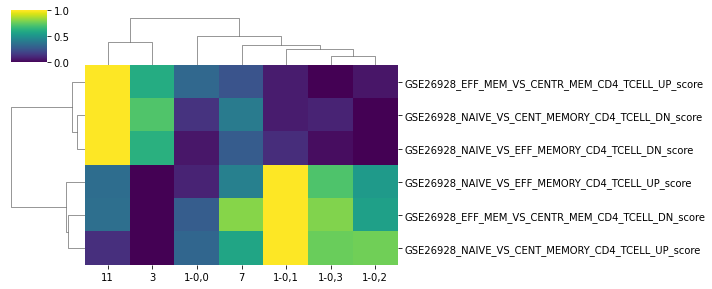

In [76]:
# calculate average enrichment score
test = rna_x[~(rna_x.obs['leiden_R2'].isin(['10','8','6', '4','2', '5','9']))]
list1 = list(set(test.obs['leiden_R2']))
subset = test.obs[['leiden_R2'] + [str(gs)+'_score' for gs in modules.columns]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset['leiden_R2'] == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in modules.columns]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(10, 4))

In [78]:
# try gene set test with Dona Farber's recent paper
modules = pd.read_csv('/home/jovyan/Prostate_analysis/scanpy/dataset/Szabo et al T cell gene module.txt', sep = '\t')
for gs in modules.columns:
    sc.tl.score_genes(rna_x, modules[gs], score_name = str(gs)+'_score', use_raw=True)

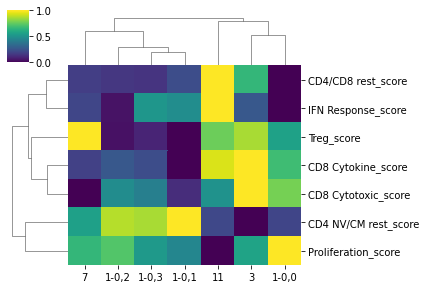

In [79]:
# calculate average enrichment score
test = rna_x[~(rna_x.obs['leiden_R2'].isin(['10','8','6', '4','2', '5','9']))]
list1 = list(set(test.obs['leiden_R2']))
subset = test.obs[['leiden_R2'] + [str(gs)+'_score' for gs in modules.columns]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset['leiden_R2'] == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in modules.columns]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(6, 4))

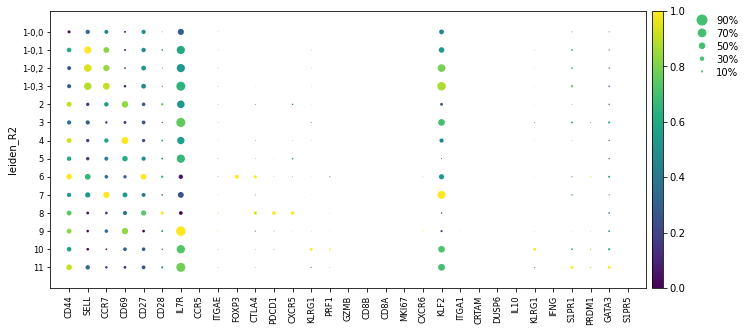

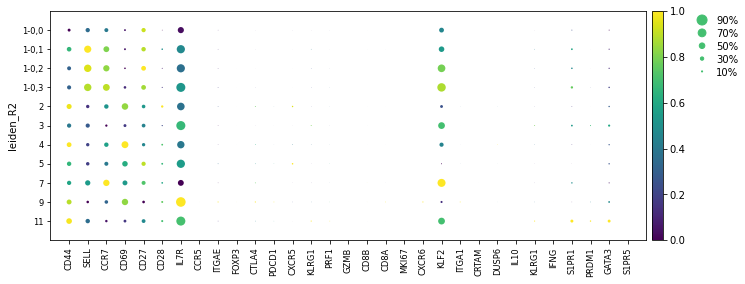

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.85, 0, 0.2, 0.5, 0.25])

In [80]:
sc.pl.dotplot(rna_x, ['CD44', 'SELL', 'CCR7', 'CD69', 'CD27', 'CD28', 'IL7R', 'CCR5', 'ITGAE', 'FOXP3', 'CTLA4', 'PDCD1', 'CXCR5', 'KLRG1', 'PRF1', 'GZMB', 'CD8B', 'CD8A', 'MKI67', 'CXCR6', 'KLF2', 'ITGA1', 'CRTAM', 'DUSP6', 'IL10', 'KLRG1', 'IFNG', 'S1PR1', 'PRDM1', 'GATA3', 'S1PR5'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'viridis')
sc.pl.dotplot(rna_x[~(rna_x.obs['leiden_R'].isin(['10','8','6']))], ['CD44', 'SELL', 'CCR7', 'CD69', 'CD27', 'CD28', 'IL7R', 'CCR5', 'ITGAE', 'FOXP3', 'CTLA4', 'PDCD1', 'CXCR5', 'KLRG1', 'PRF1', 'GZMB', 'CD8B', 'CD8A','MKI67', 'CXCR6', 'KLF2', 'ITGA1', 'CRTAM','DUSP6', 'IL10','KLRG1', 'IFNG',  'S1PR1', 'PRDM1', 'GATA3',  'S1PR5'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'viridis')

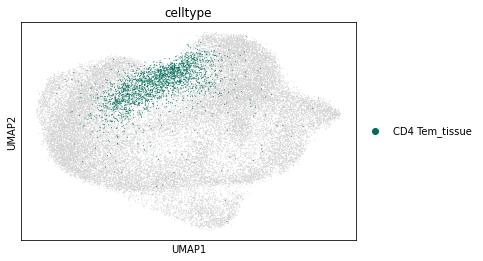

In [73]:
sc.pl.umap(rna_x, color=['celltype'], groups = ['CD4 Tem_tissue'])

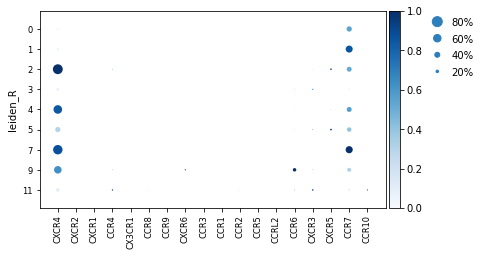

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.3, 0, 0.2, 0.5, 0.25])

In [81]:
sc.pl.dotplot(rna_x[~(rna_x.obs['leiden_R2'].isin(['10','8','6']))], list(rna_x.raw.var[rna_x.raw.var.index.str.contains('^CXCR|^CCR|^CX3CR')].index), groupby = 'leiden_R', standard_scale = 'var', color_map = 'Blues')

... storing 'celltype' as categorical


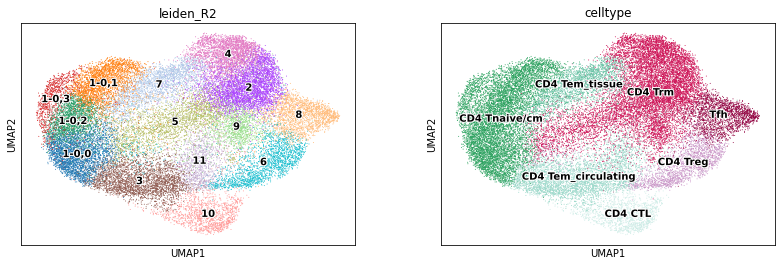

In [84]:
new_dict1 = {
'1-0,0':'CD4 Tnaive/cm',
'1-0,1':'CD4 Tnaive/cm',
'1-0,2':'CD4 Tnaive/cm',
'1-0,3':'CD4 Tnaive/cm',
'2':'CD4 Trm',
'3':'CD4 Tem_circulating',
'4':'CD4 Trm',
'5':'CD4 Trm',
'6':'CD4 Treg',
'7':'CD4 Tem_tissue',
'8':'Tfh',
'9':'CD4 Trm',
'10':'CD4 CTL',
'11':'CD4 Tem_circulating'
}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R2']]
sc.pl.umap(rna_x, color=['leiden_R2', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


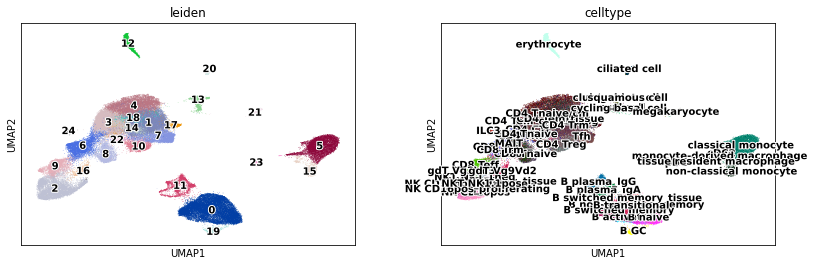

In [85]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

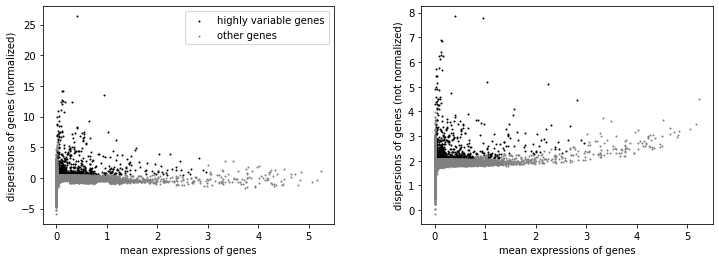

AnnData object with n_obs × n_vars = 10772 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [105]:
# subset to CD8T cells
rna_ = adata[adata.obs['leiden'].isin(['6', '8', '9'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [106]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

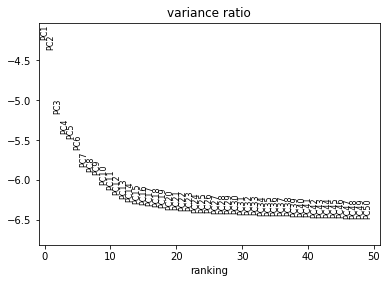

In [107]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

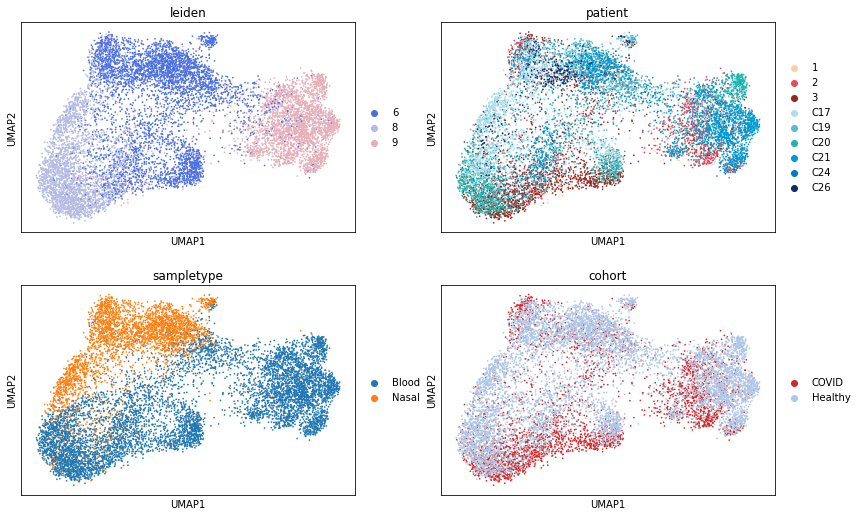

In [108]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype', 'cohort'], ncols =2, )

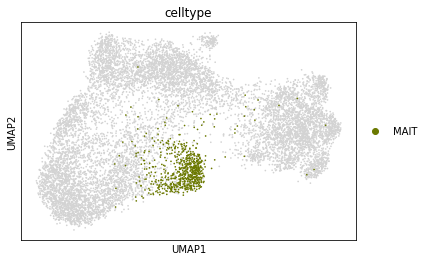

In [109]:
sc.pl.umap(rna_x, color=['celltype'], groups = ['MAIT'], ncols =2)

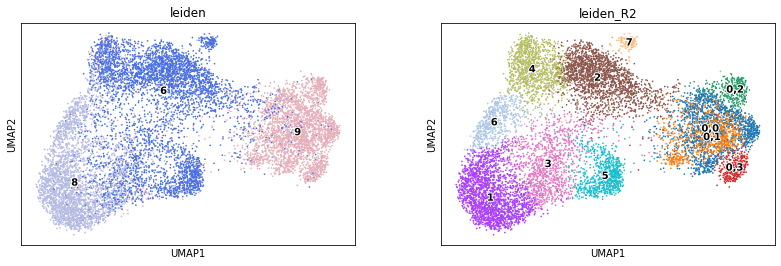

In [112]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R')
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['0']), resolution = 0.5)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

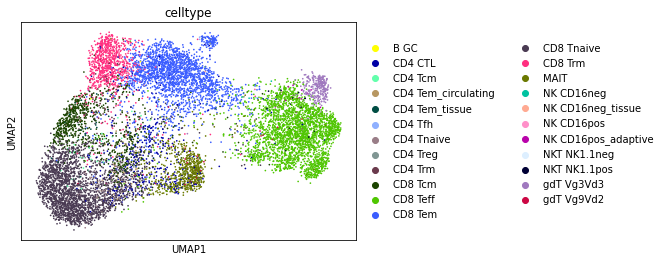

In [125]:
sc.pl.umap(rna_x, color=['celltype'],)

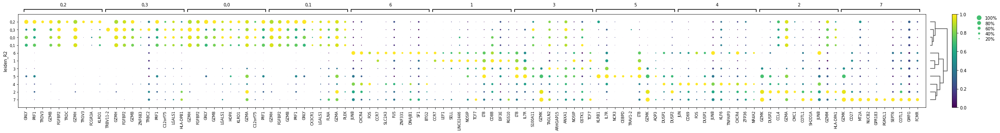

In [113]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R2')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

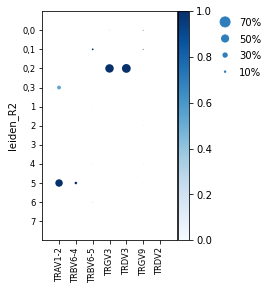

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[2.4499999999999997, 0, 0.2, 0.5, 0.25])

In [114]:
sc.pl.dotplot(rna_x, ['TRAV1-2', 'TRBV6-4', 'TRBV6-5', 'TRGV3', 'TRDV3', 'TRGV9', 'TRDV2'], groupby = 'leiden_R2',standard_scale = 'var', color_map = 'Blues')

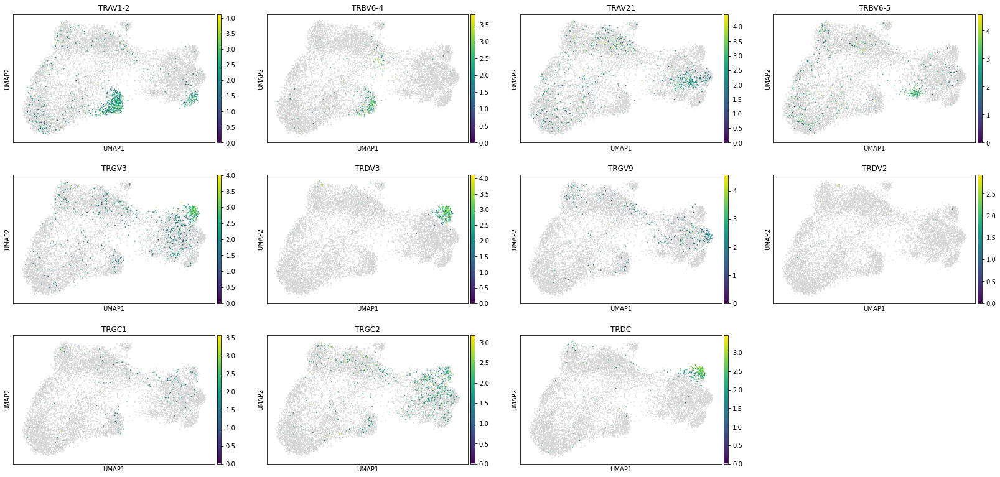

In [115]:
sc.pl.umap(rna_x, color = ['TRAV1-2', 'TRBV6-4', 'TRAV21', 'TRBV6-5', 'TRGV3', 'TRDV3', 'TRGV9', 'TRDV2', 'TRGC1','TRGC2','TRDC'], color_map = newcmp)

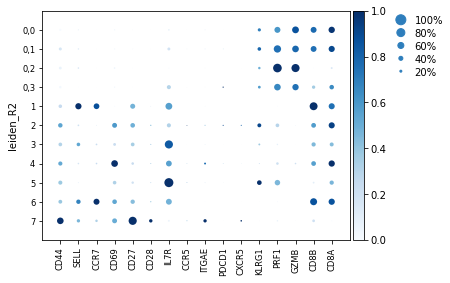

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [116]:
sc.pl.dotplot(rna_x, ['CD44', 'SELL', 'CCR7', 'CD69', 'CD27', 'CD28', 'IL7R', 'CCR5', 'ITGAE', 'PDCD1', 'CXCR5', 'KLRG1', 'PRF1', 'GZMB', 'CD8B', 'CD8A'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')

In [117]:
Kumar_Trm_signature = {
    'CD69+Trm':['CA10','ITGAE1','ITGAE','IL2','IL10','CXCR6','CXCL13','KCNK5','RGS1','CRTAM','DUSP6','PDCD1','IL23R'],
    'CD69-Tem':['STK38','TTC16','SELL','KLF3','KLF2','D4S234E','SBK1','FAM65B','TTYH2','NPDC1','KRT72','S1PR1','SOX13','KRT73','TSPAN18','PTGDS','RAP1GAP2','CX3CR1']}
Mackay_Trm_signature={
    'Trm':['INSIG1', 'DDX3X', 'DHCR24', 'PPP1R16B', 'KLF6', 'BTG2', 'CXCR6', 'FOSB', 'JUN', 'HSPA5', 'NEDD4', 'PLK3', 'STARD4', 'TNFAIP3', 'B4GALNT4', 'IRF4', 'CISH', 'MAPKAPK3', 'SIK1', 'PYGL', 'CTNNA1', 'ODC1', 'PER1', 'DUSP1', 'ATF3', 'LDLRAD4', 'JUNB', 'NFKBID', 'FOSL2', 'RGS2', 'NR4A2', 'DGAT1', 'ARRDC3', 'FRMD4B', 'NR4A1', 'GPR171', 'SMIM3', 'EYA2', 'GPR55', 'AL662899.4', 'CSRNP1', 'TRAF4', 'ZFP36', 'GLRX', 'DUSP5', 'LITAF', 'GADD45B', 'IFNG', 'OSGIN1', 'ABI3', 'EGR1', 'HILPDA', 'SKIL', 'RNF149', 'HMGCS1', 'P4HB', 'PNRC1', 'GPR34', 'PPP1R15A', 'ITGAE', 'P2RY10', 'EHD1', 'DUSP6', 'XCL2', 'SPSB1', 'ISG20', 'INPP4B', 'NEURL3', 'HPGDS', 'RHOB', 'VDAC1', 'LAD1', 'FOS', 'CDH1', 'CD69', 'QPCT', 'HSPD1'],
    'Tcm/Tem':['HBA2', 'C19orf38', 'SNX10', 'HAAO', 'POGK', 'SBK1', 'KLF2', 'BCL9L', 'THAP7', 'ASRGL1', 'ELMO1', 'HEXB', 'RACGAP1', 'CXCR4', 'CDC25B', 'LFNG', 'S1PR5', 'ARHGAP26', 'MPND', 'KCNAB2', 'ATP1B3', 'S1PR4', 'TMEM71', 'KBTBD11', 'EMB', 'MS4A4A', 'GRAMD4', 'EHD3', 'KCNN4', 'TCF7', 'MS4A4A', 'PAQR7', 'FAM89B', 'LYST', 'GLIPR2', 'EML3', 'S1PR1', 'PIK3R5', 'SETX', 'TXNDC5', 'NCLN', 'STK38', 'ITGA4', 'CCL5', 'CD84', 'KLF3', 'ABTB2', 'TBXA2R', 'LYRM2', 'OBP2B', 'ACP5', 'PODNL1', 'LEF1', 'SH2D1A', 'PHF11', 'TSR3', 'GMFG', 'EOMES', 'GNPDA2', 'PDE2A', 'SIDT1', 'GAB3', 'TXK', 'AVEN', 'ICAM2', 'KLHL6', 'SAMHD1', 'SMPDL3B', 'TTC7B', 'C5orf30', 'ATP10D', 'ST3GAL1', 'VOPP1', 'PCED1B', 'DOCK2', 'ITGB1', 'FAM117A', 'IL10RA', 'LPIN1', 'RBM43', 'ARHGEF18', 'RASA3', 'ABHD8', 'FAM49A', 'RASGRP2', 'B3GAT3', 'PRKCQ', 'XRN2']}

In [118]:
for gs in Kumar_Trm_signature:
    sc.tl.score_genes(rna_x, Kumar_Trm_signature[gs], score_name = str(gs)+'_score', use_raw=True)
for gs in Mackay_Trm_signature:
    sc.tl.score_genes(rna_x, Mackay_Trm_signature[gs], score_name = str(gs)+'_score', use_raw=True)

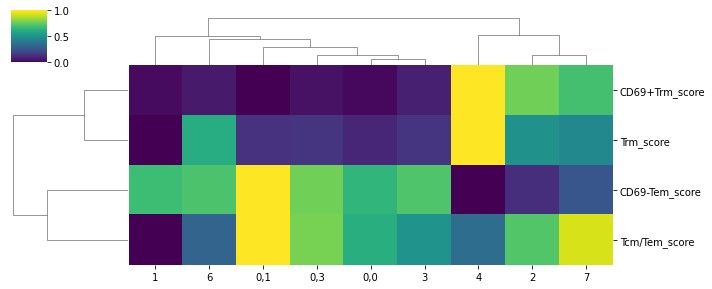

In [119]:
# calculate average enrichment score
test = rna_x[~(rna_x.obs['leiden_R2'].isin(['5','0,2']))]
list1 = list(set(test.obs['leiden_R2']))
subset = test.obs[['leiden_R2'] + [str(gs)+'_score' for gs in Kumar_Trm_signature]+[str(gs)+'_score' for gs in Mackay_Trm_signature]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset['leiden_R2'] == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in Kumar_Trm_signature]+[str(gs)+'_score' for gs in Mackay_Trm_signature]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(10, 4))

In [120]:
# try gene set test with Dona Farber's recent paper
modules = pd.read_csv('/home/jovyan/Prostate_analysis/scanpy/dataset/Szabo et al T cell gene module.txt', sep = '\t')
for gs in modules.columns:
    sc.tl.score_genes(rna_x, modules[gs], score_name = str(gs)+'_score', use_raw=True)

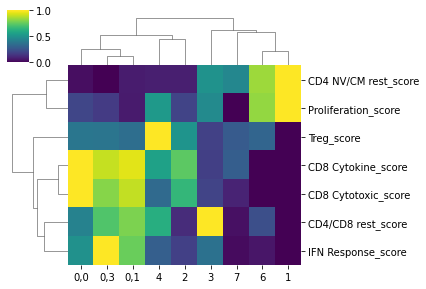

In [121]:
# calculate average enrichment score
test = rna_x[~(rna_x.obs['leiden_R2'].isin(['5','0,2']))]
list1 = list(set(test.obs['leiden_R2']))
subset = test.obs[['leiden_R2'] + [str(gs)+'_score' for gs in modules.columns]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset['leiden_R2'] == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in modules.columns]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(6, 4))

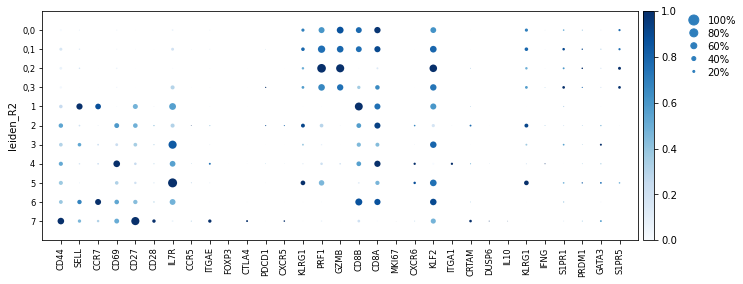

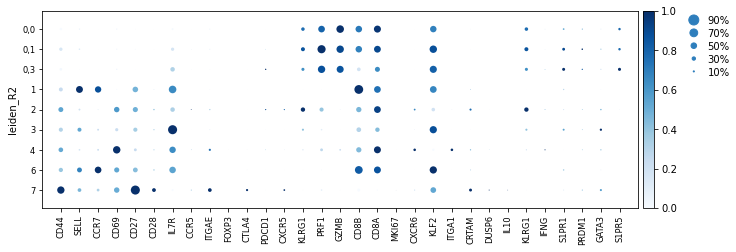

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.85, 0, 0.2, 0.5, 0.25])

In [123]:
sc.pl.dotplot(rna_x, ['CD44', 'SELL', 'CCR7', 'CD69', 'CD27', 'CD28', 'IL7R', 'CCR5', 'ITGAE', 'FOXP3', 'CTLA4', 'PDCD1', 'CXCR5', 'KLRG1', 'PRF1', 'GZMB', 'CD8B', 'CD8A', 'MKI67', 'CXCR6', 'KLF2', 'ITGA1', 'CRTAM', 'DUSP6', 'IL10', 'KLRG1', 'IFNG', 'S1PR1', 'PRDM1', 'GATA3', 'S1PR5'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')
sc.pl.dotplot(rna_x[~(rna_x.obs['leiden_R2'].isin(['5', '0,2']))], ['CD44', 'SELL', 'CCR7', 'CD69', 'CD27', 'CD28', 'IL7R', 'CCR5', 'ITGAE', 'FOXP3', 'CTLA4', 'PDCD1', 'CXCR5', 'KLRG1', 'PRF1', 'GZMB', 'CD8B', 'CD8A','MKI67', 'CXCR6', 'KLF2', 'ITGA1', 'CRTAM','DUSP6', 'IL10','KLRG1', 'IFNG',  'S1PR1', 'PRDM1', 'GATA3',  'S1PR5'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')

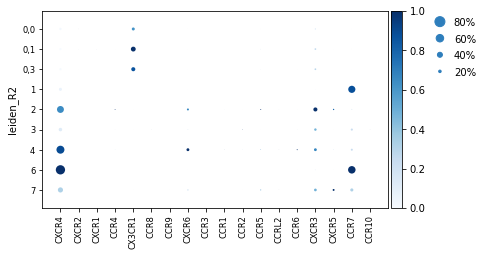

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.3, 0, 0.2, 0.5, 0.25])

In [124]:
sc.pl.dotplot(rna_x[~(rna_x.obs['leiden_R2'].isin(['5', '0,2']))], list(rna_x.raw.var[rna_x.raw.var.index.str.contains('^CXCR|^CCR|^CX3CR')].index), groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')

... storing 'celltype' as categorical


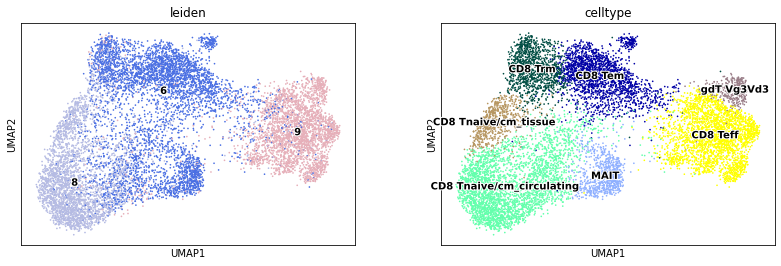

In [126]:
new_dict1 = {
'0,0':'CD8 Teff',
'0,1':'CD8 Teff',
'0,2':'gdT Vg3Vd3',
'0,3':'CD8 Teff',
'1':'CD8 Tnaive/cm_circulating',
'2':'CD8 Tem',
'3':'CD8 Tnaive/cm_circulating',
'4':'CD8 Trm',
'5':'MAIT',
'6':'CD8 Tnaive/cm_tissue',
'7':'CD8 Tem'
}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R2']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


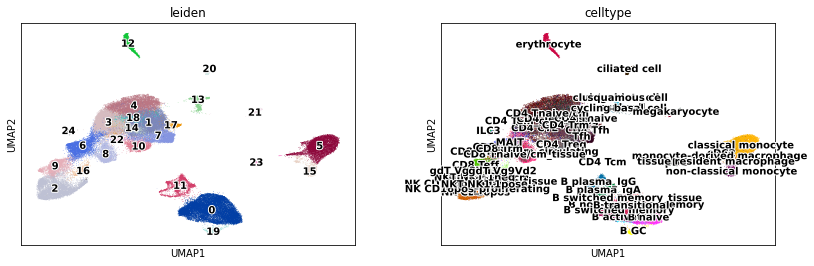

In [127]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

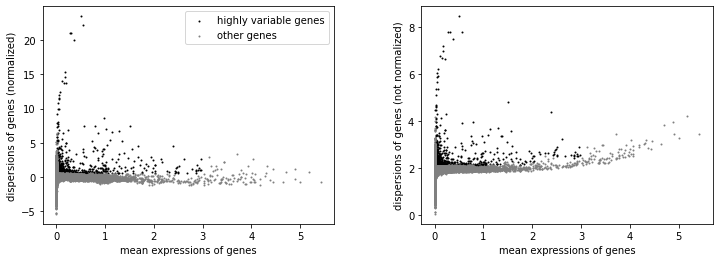

AnnData object with n_obs × n_vars = 7246 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [179]:
# subset to NK
rna_ = adata[adata.obs['leiden'].isin(['2','24'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [180]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

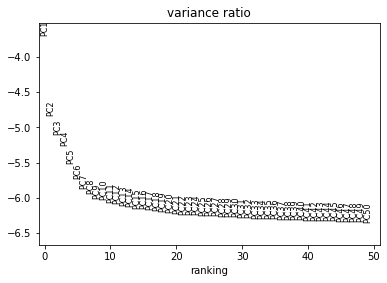

In [181]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

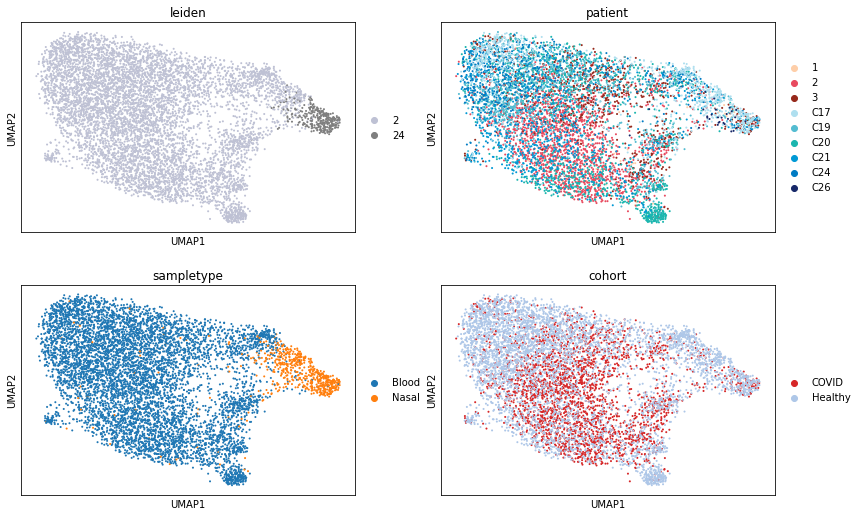

In [182]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype', 'cohort'], ncols =2, )

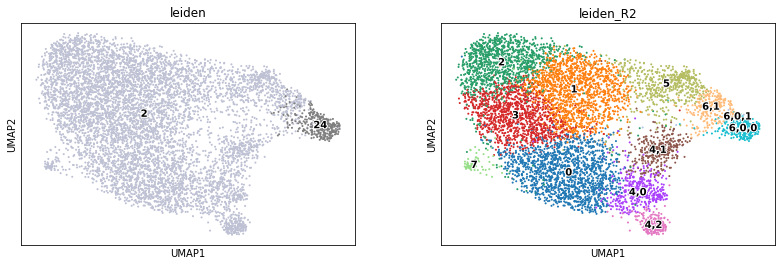

In [192]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R')
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['4']), resolution =.5)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R2', ['6']), resolution =.5)
sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R2', ['6,0']), resolution =.5)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R2'], legend_loc ='on data', legend_fontoutline=2)

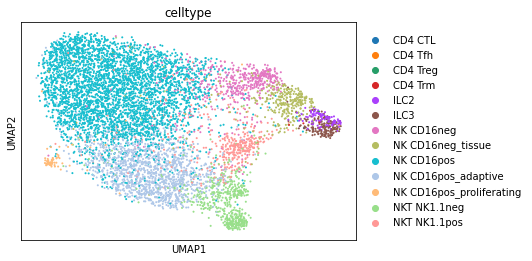

In [184]:
sc.pl.umap(rna_x, color=['celltype'])

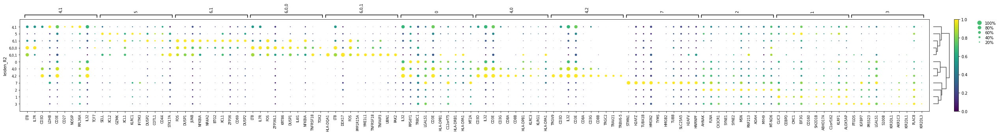

In [193]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R2', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R2')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

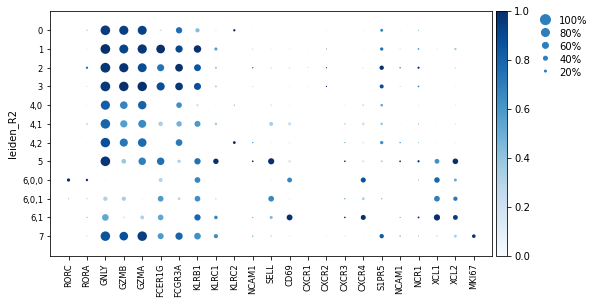

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[8.049999999999999, 0, 0.2, 0.5, 0.25])

In [194]:
sc.pl.dotplot(rna_x, ['RORC', 'RORA', 'GNLY', 'GZMB', 'GZMA', 'FCER1G', 'FCGR3A', 'KLRB1', 'KLRC1', 'KLRC2', 'NCAM1', 'SELL', 'CD69', 'CXCR1', 'CXCR2', 'CXCR3', 'CXCR4', 'S1PR5',  'NCAM1', 'NCR1', 'XCL1', 'XCL2', 'MKI67'], groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')

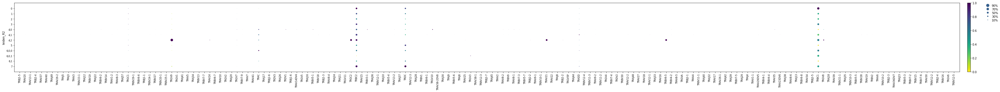

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[60.55, 0, 0.2, 0.5, 0.25])

In [195]:
sc.pl.dotplot(rna_x,list(set(rna_x.raw.var.index[rna_x.raw.var.index.str.contains('^TR[ABGD][VDJC]')])), groupby = 'leiden_R2', standard_scale = 'var', color_map = 'viridis_r')

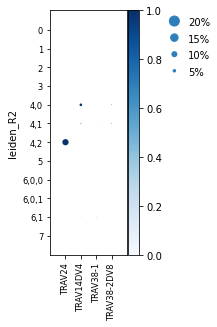

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [196]:
sc.pl.dotplot(rna_x,list(set(rna_x.raw.var.index[rna_x.raw.var.index.str.contains('^TRAV14|^TRAV24|^TRAV38')])), groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues')

In [197]:
markers = {'Inhibitory':['KLRC1', 'KLRG1', 'PDCD1', 'HAVCR2', 'LAG3', 'CD96', 'TIGIT'],
'Activating':['B3GAT1', 'NCR1', 'NCR2', 'NCR3', 'FCGR3A', 'CD244', 'CD226', 'KLRK1'],
'Memory':['KLRC2']}

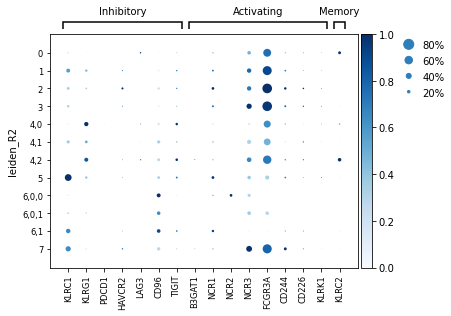

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [198]:
sc.pl.dotplot(rna_x, markers, groupby = 'leiden_R2', standard_scale = 'var', color_map = 'Blues', var_group_rotation =0)

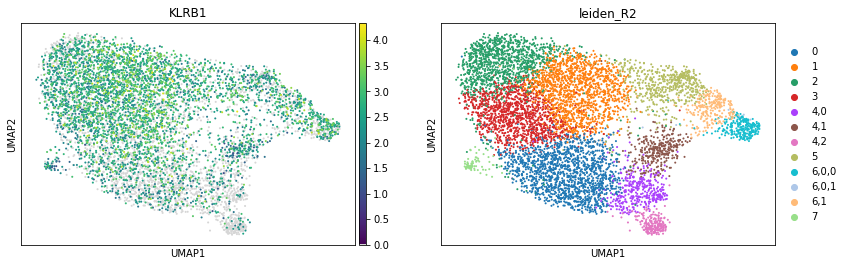

In [199]:
sc.pl.umap(rna_x, color = ['KLRB1', 'leiden_R2'], color_map = newcmp)

... storing 'celltype' as categorical


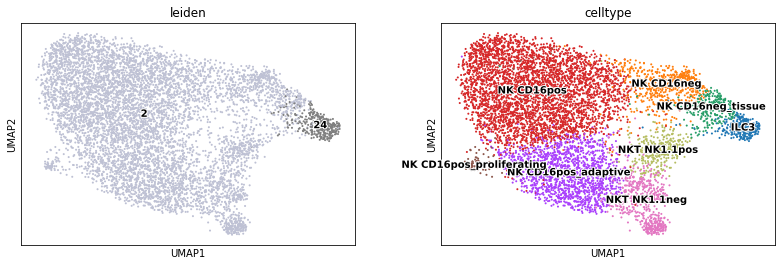

In [201]:
new_dict1 = {
'0':'NK CD16pos_adaptive',
'1':'NK CD16pos',
'2':'NK CD16pos',
'3':'NK CD16pos',
'4,0':'NKT NK1.1neg',
'4,1':'NKT NK1.1pos',
'4,2':'NKT NK1.1neg',
'5':'NK CD16neg',
'6,0,0':'ILC3',
'6,0,1':'ILC3',
'6,1':'NK CD16neg_tissue',
'7':'NK CD16pos_proliferating'
}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R2']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


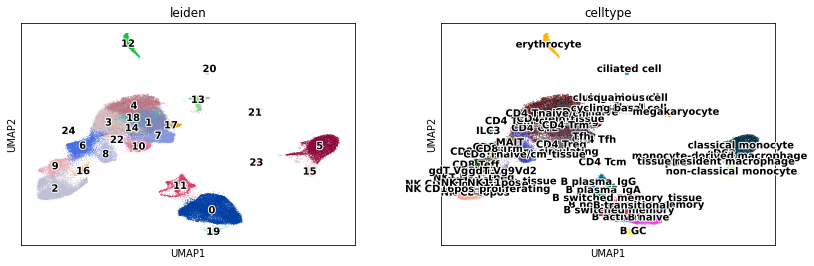

In [202]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

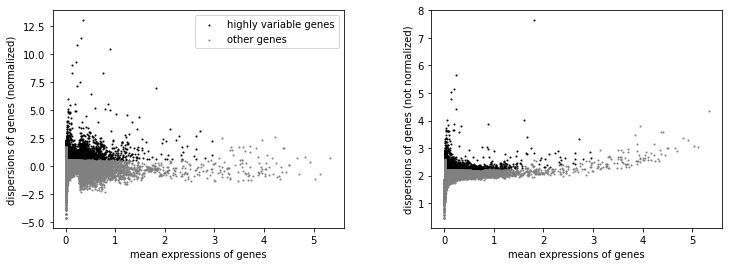

AnnData object with n_obs × n_vars = 1067 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [203]:
# subset to gdT
rna_ = adata[adata.obs['leiden'].isin(['16'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [204]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

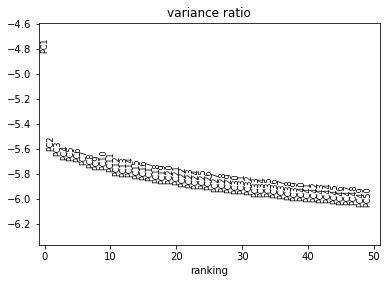

In [205]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

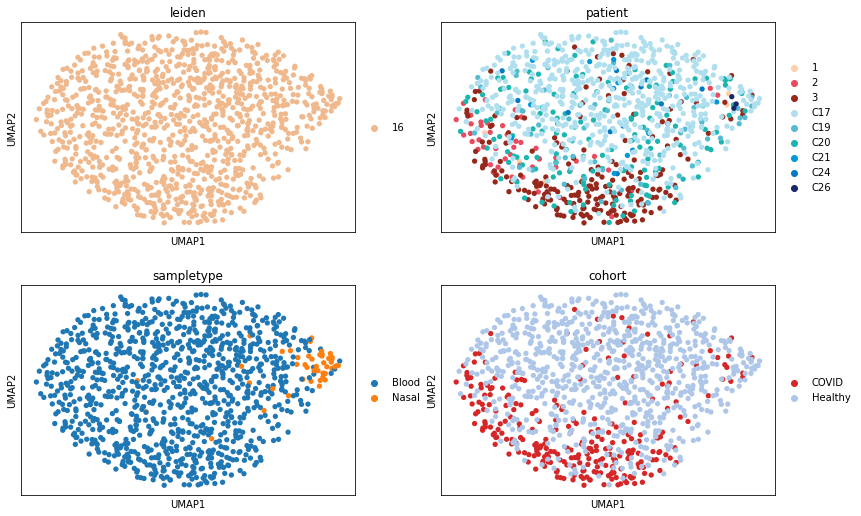

In [206]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype', 'cohort'], ncols =2, )

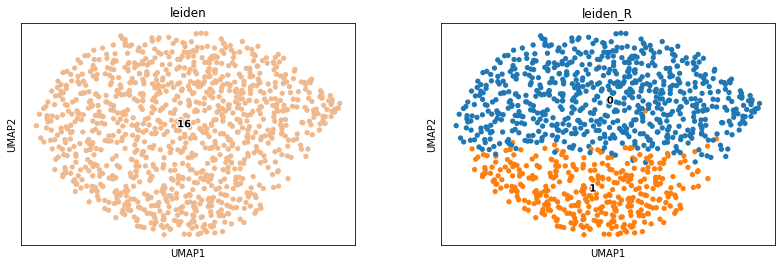

In [207]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R', resolution = 0.6)
# sc.tl.leiden(rna_x, key_added = 'leiden_R2', restrict_to = ('leiden_R', ['4']), resolution =.5)
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], legend_loc ='on data', legend_fontoutline=2)

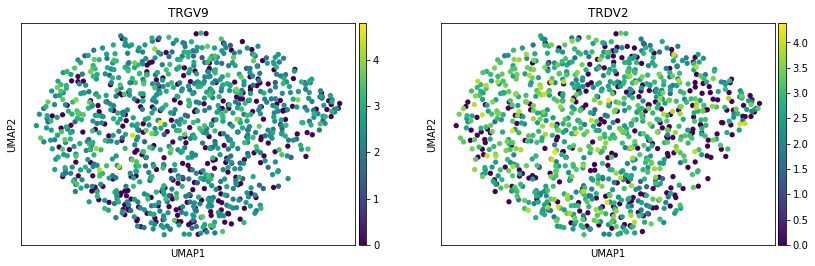

In [208]:
sc.pl.umap(rna_x, color=['TRGV9', 'TRDV2'])

... storing 'celltype' as categorical


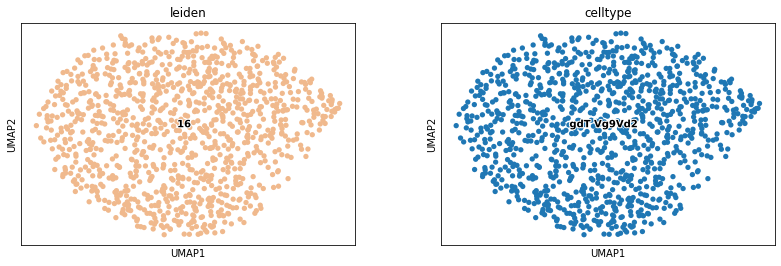

In [209]:
new_dict1 = {
'0':'gdT Vg9Vd2',
'1':'gdT Vg9Vd2'
}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


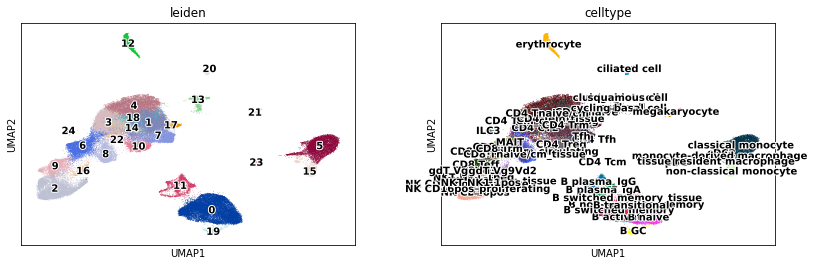

In [210]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

### pDC

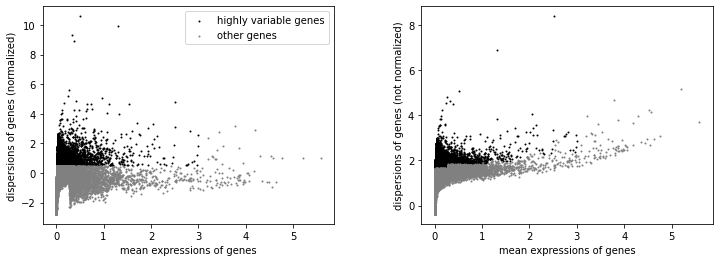

AnnData object with n_obs × n_vars = 387 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [211]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['23'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [212]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

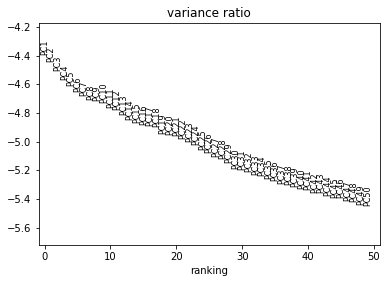

In [213]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

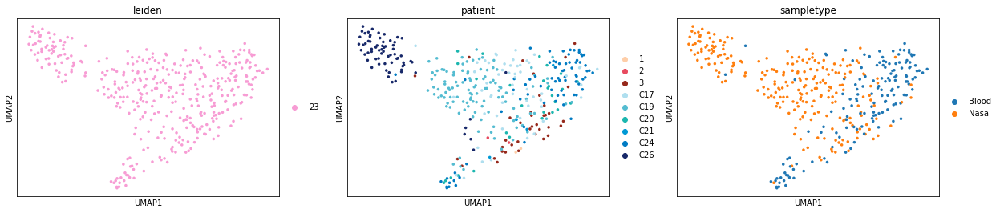

In [214]:
# run BBKNN
# sc.external.pp.bbknn(rna_x, batch_key = 'patient')
sc.pp.neighbors(rna_x)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

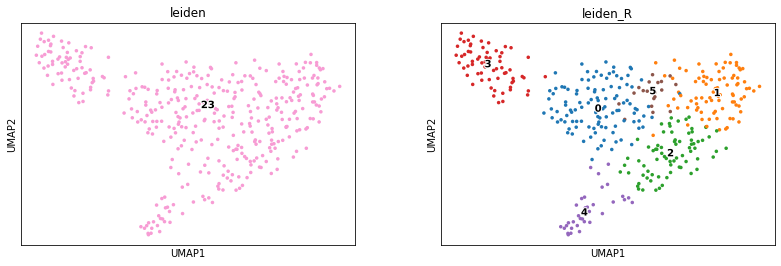

In [215]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

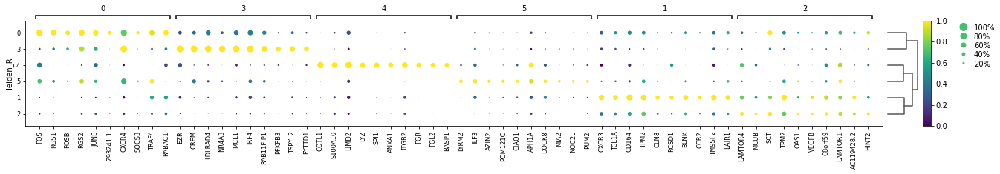

In [216]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R', method = 'wilcoxon')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

... storing 'celltype' as categorical


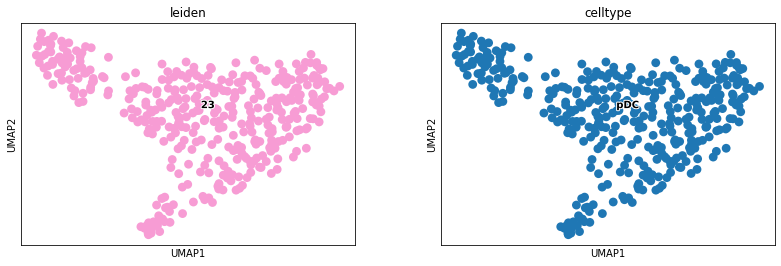

In [217]:
new_dict1 = {
'0':'pDC',
'1':'pDC',
'2':'pDC',
'3':'pDC',
'4':'pDC',
'5':'pDC'
}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


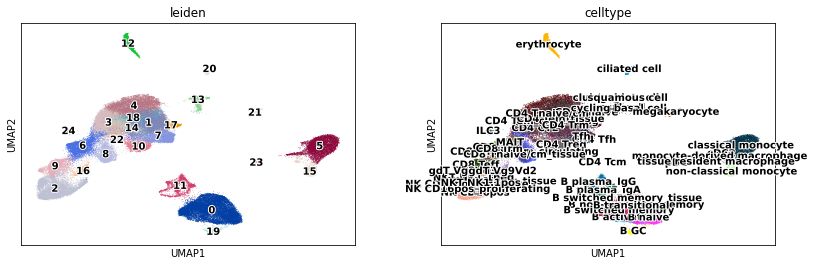

In [218]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

### Megakaryocyte and erythrocyte

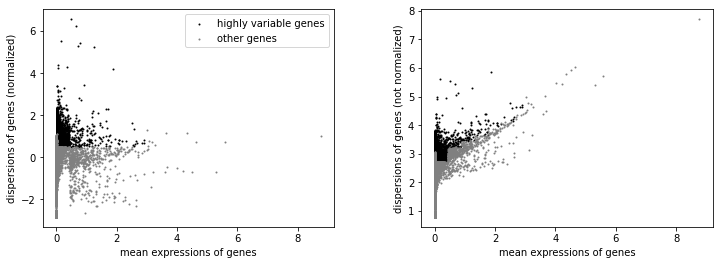

AnnData object with n_obs × n_vars = 1818 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [219]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['21', '12'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [220]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

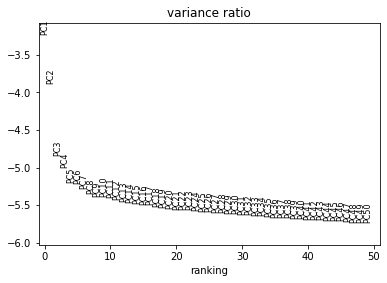

In [221]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

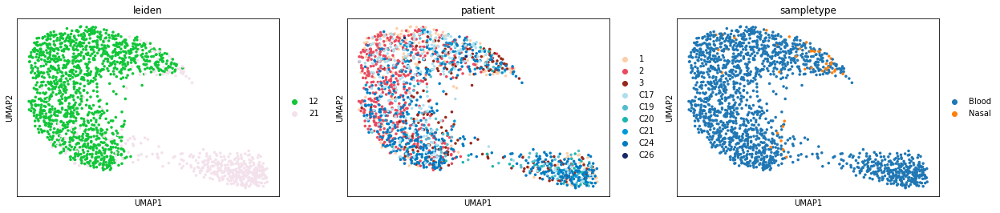

In [223]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch = 2)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

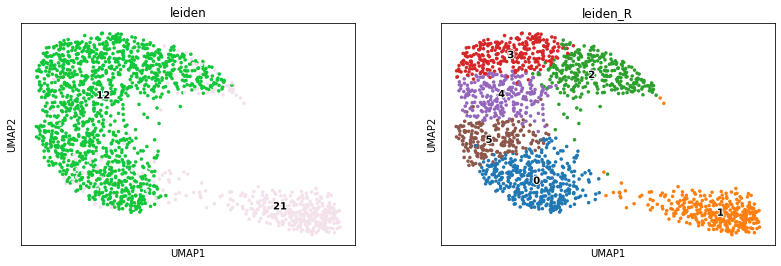

In [224]:
# find clusters
sc.tl.leiden(rna_x, resolution = 1, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], size=50, legend_loc ='on data', legend_fontoutline=2)

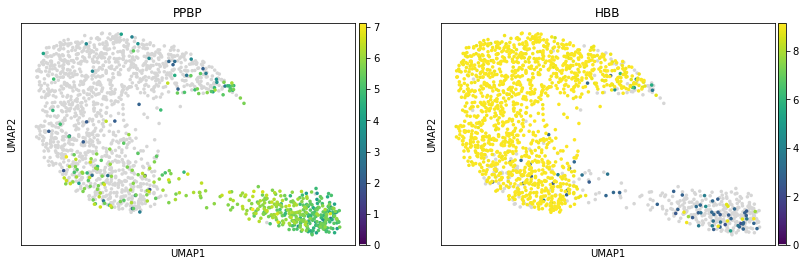

In [225]:
sc.pl.umap(rna_x, color = ['PPBP', 'HBB'], color_map = newcmp, size = 50)

... storing 'celltype' as categorical


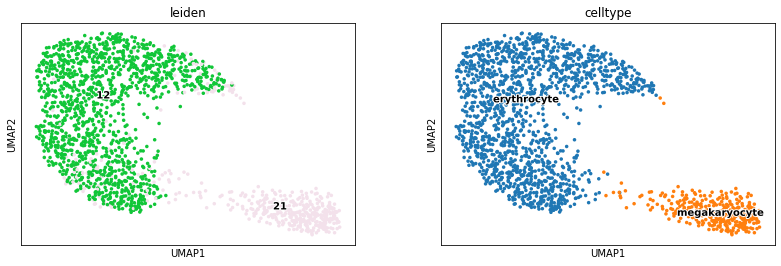

In [226]:
new_dict1 = {'0':'erythrocyte',
'1':'megakaryocyte',
'2':'erythrocyte',
'3':'erythrocyte',
'4':'erythrocyte',
'5':'erythrocyte'}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


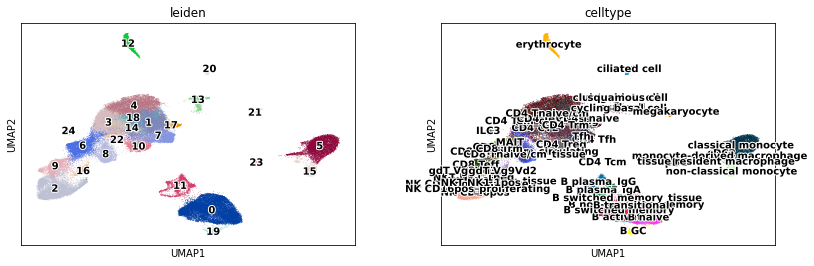

In [227]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

### Epithelial

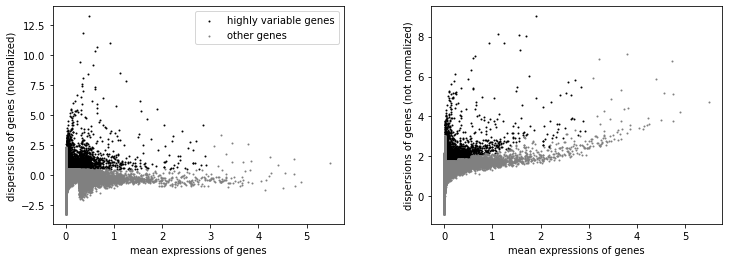

AnnData object with n_obs × n_vars = 1831 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [228]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['13', '20'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(rna_x)
rna_x

In [229]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

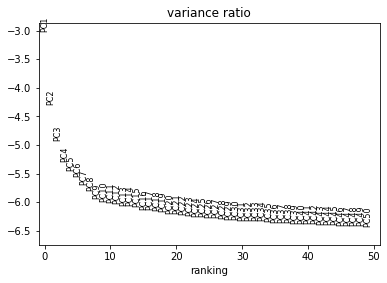

In [230]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

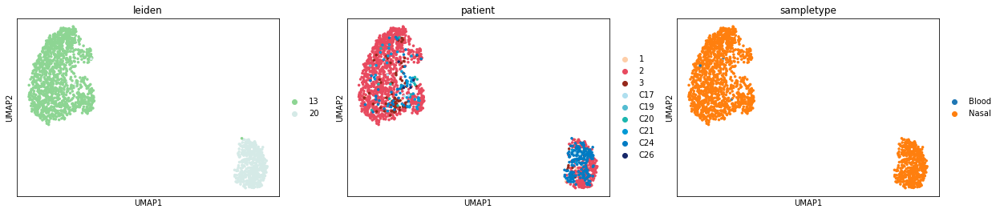

In [231]:
# run BBKNN
sc.external.pp.bbknn(rna_x, batch_key = 'patient', neighbors_within_batch = 3)
# UMAP
sc.tl.umap(rna_x, n_components = 2, min_dist = 0.3)
sc.pl.umap(rna_x, color=['leiden', 'patient', 'sampletype'], size=50)

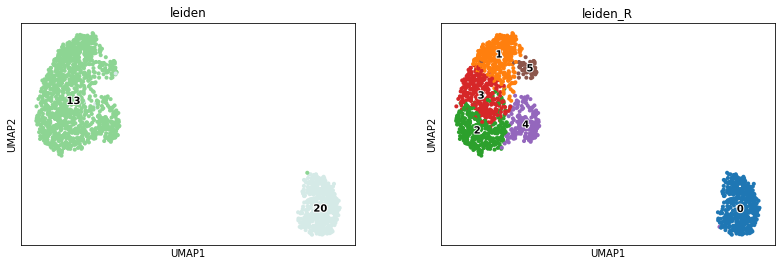

In [236]:
# find clusters
sc.tl.leiden(rna_x, key_added = 'leiden_R')
sc.pl.umap(rna_x, color=['leiden', 'leiden_R'], legend_loc ='on data', legend_fontoutline=2)

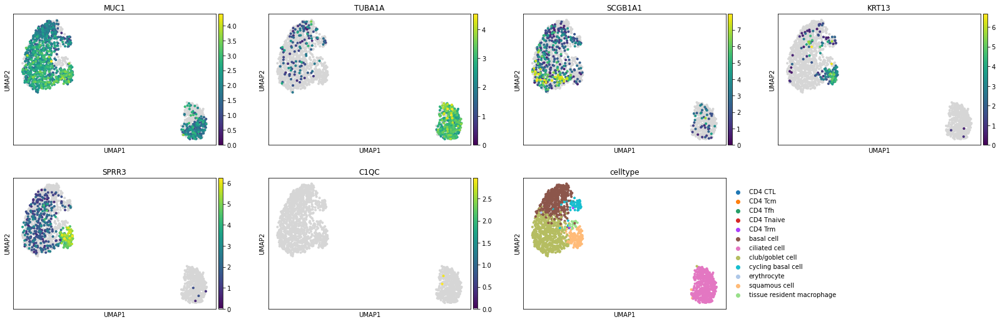

In [242]:
sc.pl.umap(rna_x, color=['MUC1', 'TUBA1A', 'SCGB1A1', 'KRT13', 'SPRR3', 'C1QC', 'celltype'], color_map = newcmp)

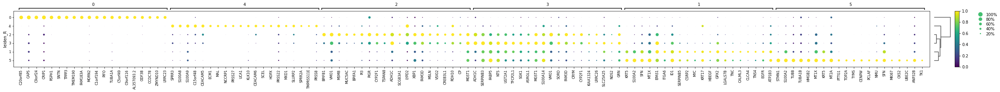

In [237]:
sc.tl.rank_genes_groups(rna_x, groupby = 'leiden_R')
sc.tl.filter_rank_genes_groups(rna_x, min_fold_change=1)
sc.tl.dendrogram(rna_x, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x, n_genes = 20, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

In [238]:
genes = {'1':['MKI67', 'CDC20', 'TOP2A', 'HIST1H4C'],
'2':['KRT14', 'DLK2', 'JAG2', 'TP63', 'LAMA3', 'KRT5'],
'differentiating':['KRT1', 'KRT10'],
'Club':['HES4', 'KRT8', 'SCGB1A1', 'MSMB', 'VMO1'],
'Goblet':['BPIFA1', 'SPDEF', 'MUC5AC', 'MUC5B', 'CCNO', 'MUC1'],
'ciliated':[ 'FOXJ1', 'PIFO', 'IFT57', 'LRRC23']}

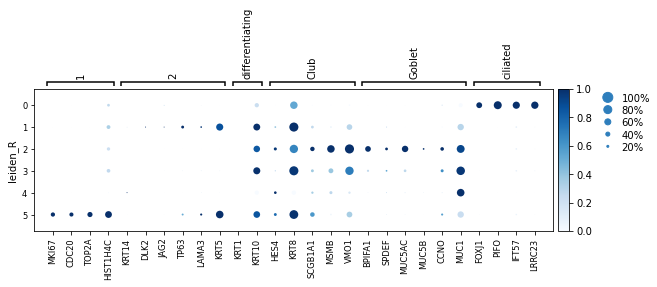

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[9.45, 0, 0.2, 0.5, 0.25])

In [239]:
sc.pl.dotplot(rna_x, genes, groupby = 'leiden_R', standard_scale = 'var', color_map = 'Blues')

... storing 'celltype' as categorical


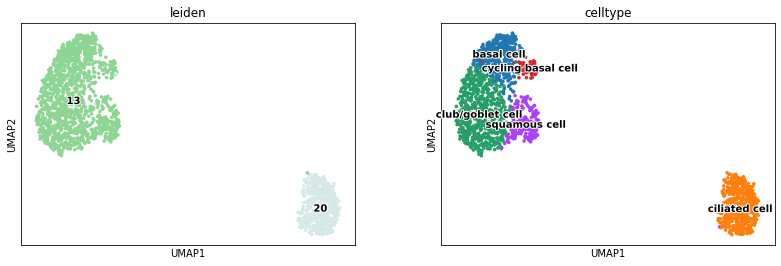

In [244]:
new_dict1 = {'0':'ciliated cell',
'1':'basal cell',
'2':'club/goblet cell',
'3':'club/goblet cell',
'4':'squamous cell',
'5':'cycling basal cell'}
rna_x.obs['celltype'] = [new_dict1[l] for l in rna_x.obs['leiden_R']]
sc.pl.umap(rna_x, color=['leiden', 'celltype'], size=50, legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


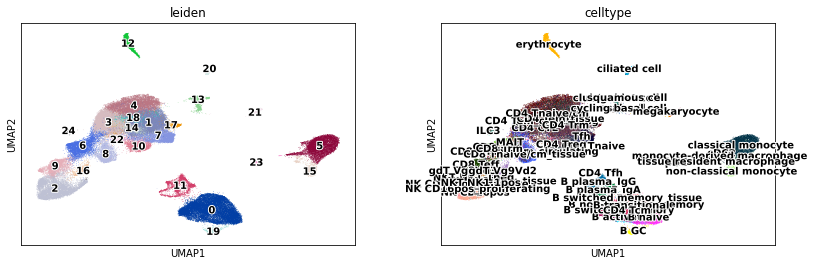

In [245]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

### B cells

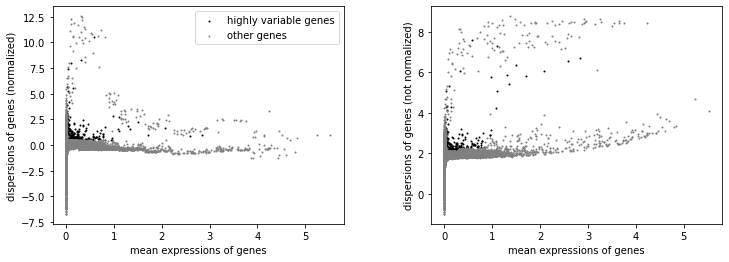

AnnData object with n_obs × n_vars = 18044 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [246]:
# subset
rna_ = adata[adata.obs['leiden'].isin(['11', '0', '19'])]
rna_x = rna_.raw.to_adata()
rna_x.raw = rna_x
sc.pp.highly_variable_genes(rna_x, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
import re
for i in rna_x.var.index:
    if re.search('^IG[HKL][VDJ]', i):
        rna_x.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna_x)
rna_x

In [247]:
# subset to highly variable
rna_x = rna_x[:, rna_x.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(rna_x, ['n_counts', 'percent_mito'])
sc.pp.scale(rna_x, max_value = 10)

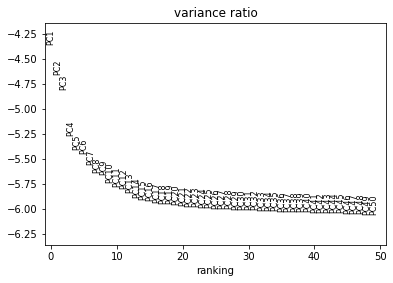

In [248]:
# Principal component analysis
sc.tl.pca(rna_x, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(rna_x, log = True, n_pcs = 50)

In [249]:
# subset to the plasma cells, B cells, and GC B cells separately
rna_x_p = rna_x[rna_x.obs['leiden'] == '11']
rna_x_b = rna_x[rna_x.obs['leiden'] == '0']
rna_x_g = rna_x[rna_x.obs['leiden'] == '19']

In [250]:
# run BBKNN
sc.external.pp.bbknn(rna_x_p, batch_key = 'patient')
sc.external.pp.bbknn(rna_x_b, batch_key = 'patient')
sc.external.pp.bbknn(rna_x_g, batch_key = 'patient')
# UMAP
sc.tl.umap(rna_x_p, n_components = 2, min_dist = 0.3)
sc.tl.umap(rna_x_b, n_components = 2, min_dist = 0.3)
sc.tl.umap(rna_x_g, n_components = 2, min_dist = 0.3)

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


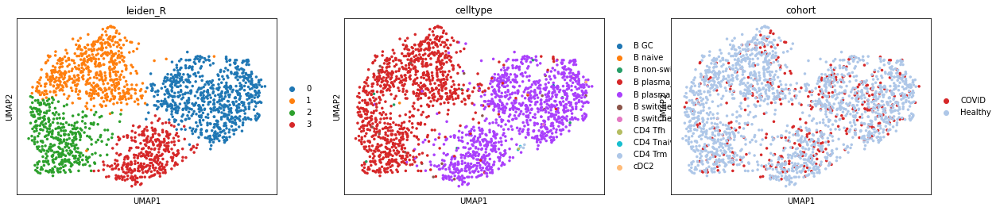

In [254]:
sc.tl.leiden(rna_x_p, key_added = 'leiden_R', resolution = .5)
sc.pl.umap(rna_x_p, color=['leiden_R', 'celltype','cohort'], size=50)

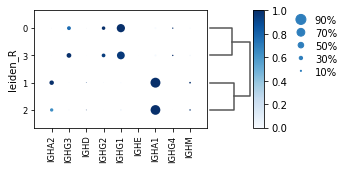

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.15, 0.8, 0.2, 0.5, 0.25])

In [255]:
sc.tl.dendrogram(rna_x_p, groupby = 'leiden_R')
sc.pl.dotplot(rna_x_p, list(set(rna_x_p.raw.var.index[rna_x_p.raw.var.index.str.contains('^IGH[AG][1234]|^IGH[MDE]$')])), groupby = 'leiden_R', color_map = 'Blues', standard_scale = 'var', dendrogram = True)

... storing 'celltype' as categorical


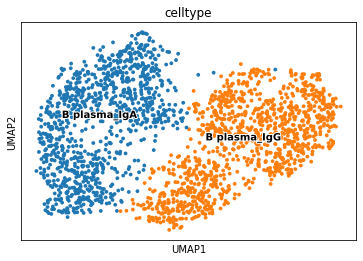

In [256]:
new_dict = {
    '0':'B plasma_IgG',
    '1':'B plasma_IgA',
    '2':'B plasma_IgA',
    '3':'B plasma_IgG'}
rna_x_p.obs['celltype'] = [new_dict[l] for l in rna_x_p.obs['leiden_R']]
sc.pl.umap(rna_x_p, color=['celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


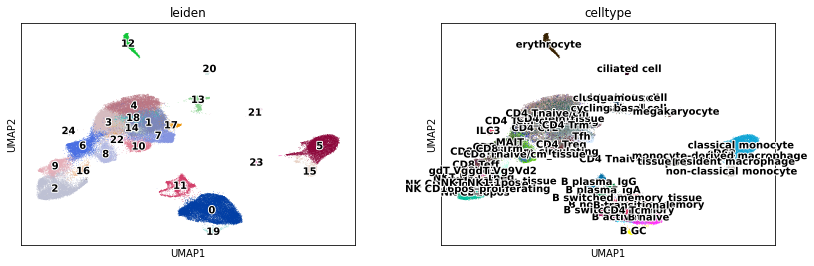

In [257]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x_p.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

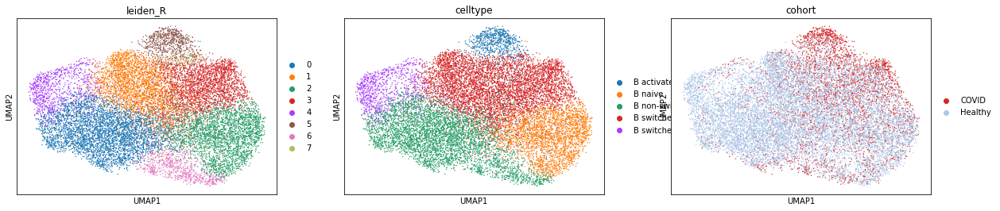

In [308]:
sc.tl.leiden(rna_x_b, key_added = 'leiden_R', resolution = 0.7)
sc.pl.umap(rna_x_b, color=['leiden_R', 'celltype', 'cohort'])

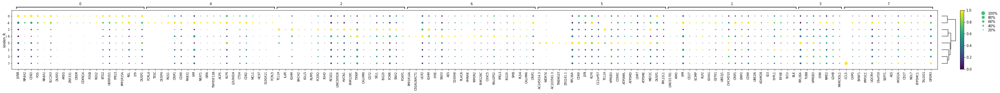

In [309]:
sc.tl.rank_genes_groups(rna_x_b, groupby = 'leiden_R')
sc.tl.filter_rank_genes_groups(rna_x_b, min_fold_change=1)
sc.tl.dendrogram(rna_x_b, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x_b, n_genes = 20, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

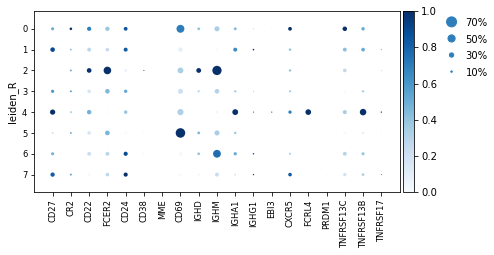

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.6499999999999995, 0, 0.2, 0.5, 0.25])

In [310]:
sc.pl.dotplot(rna_x_b, ['CD27', 'CR2', 'CD22', 'FCER2', 'CD24', 'CD38', 'MME', 'CD69', 'IGHD', 'IGHM', 'IGHA1', 'IGHG1', 'EBI3', 'CXCR5', 'FCRL4', 'PRDM1', 'TNFRSF13C', 'TNFRSF13B', 'TNFRSF17'], groupby = 'leiden_R', standard_scale = 'var', color_map ='Blues')

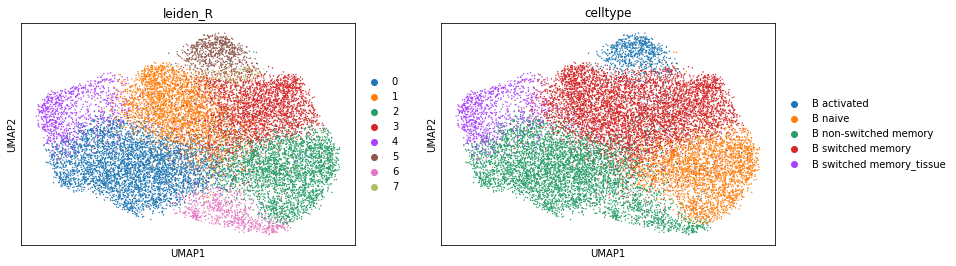

In [311]:
sc.pl.umap(rna_x_b, color=['leiden_R', 'celltype'])

In [312]:
df1 = pd.read_csv('datasets/GSE22886_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df2 = pd.read_csv('datasets/GSE38697_GSE12845_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df3 = pd.read_csv('datasets/Bcell_genesets.txt', sep='\t', header=0, index_col = None, na_filter=False)
df4 = pd.read_csv('datasets/Monaco B cells.txt', sep='\t', header=0, index_col = None, na_filter=False)

In [313]:
def geneset_score(self, genesets, groupby, figsize=(3, 4), cmap = 'viridis', col_cluster = True, row_cluster = True):
    import seaborn as sns
    for s in genesets:
        sc.tl.score_genes(self, [y for y in genesets[s] if y != ''], use_raw = True, score_name= str(s)+'_score')
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s)+'_score' for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s)+'_score' for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s)+'_score' for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = col_cluster, row_cluster = row_cluster)
    sc.pl.umap(self, color = [str(s)+'_score' for s in genesets], size = 80, ncols = 2)
    print(g)

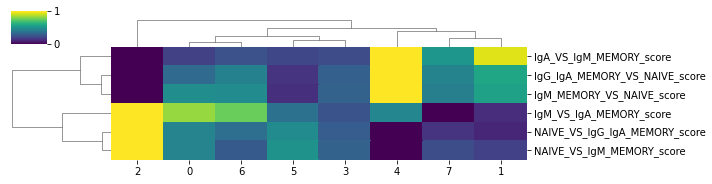

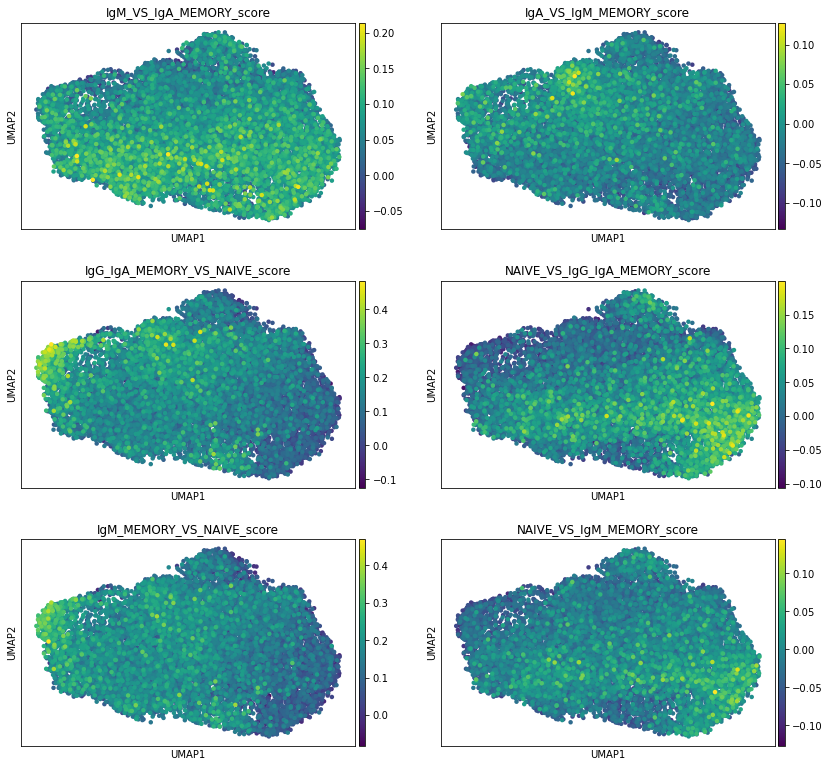

In [314]:
geneset_score(rna_x_b, df1, 'leiden_R', (10,2.5))

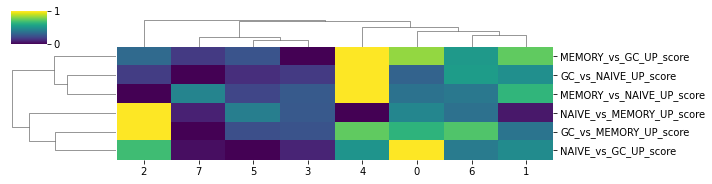

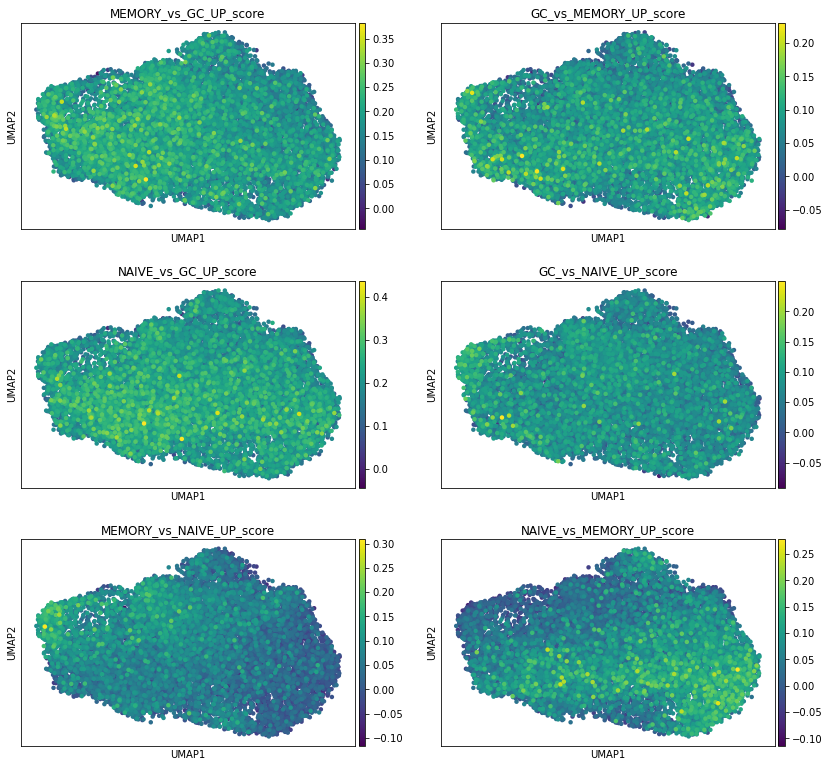

In [315]:
geneset_score(rna_x_b, df3, 'leiden_R', (10,2.5))

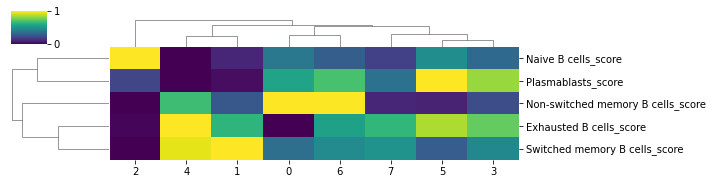

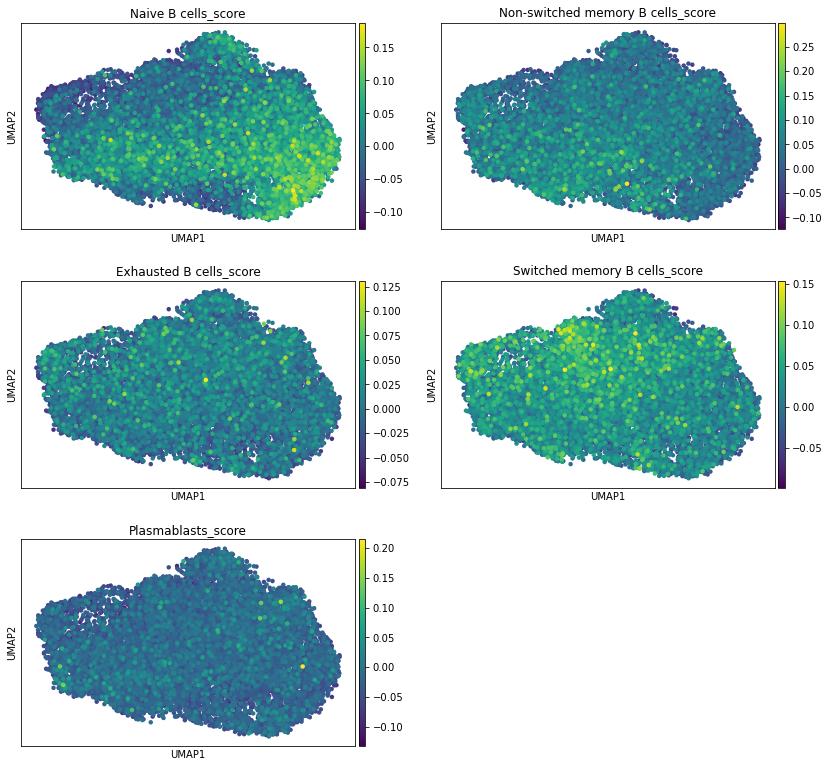

In [316]:
geneset_score(rna_x_b, df4, 'leiden_R', (10,2.5))

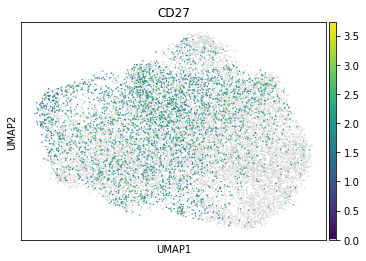

In [317]:
sc.pl.umap(rna_x_b, color = 'CD27', color_map = newcmp)

... storing 'celltype' as categorical


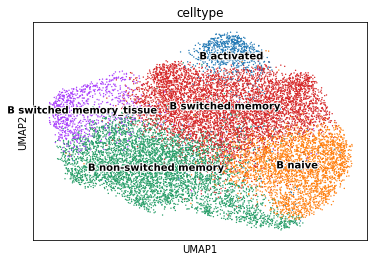

In [318]:
new_dict = {'0':'B non-switched memory',
'1':'B switched memory',
'2':'B naive',
'3':'B switched memory',
'4':'B switched memory_tissue',
'5':'B activated',
'6':'B non-switched memory',
'7':'B switched memory'}
rna_x_b.obs['celltype'] = [new_dict[l] for l in rna_x_b.obs['leiden_R']]
sc.pl.umap(rna_x_b, color=['celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


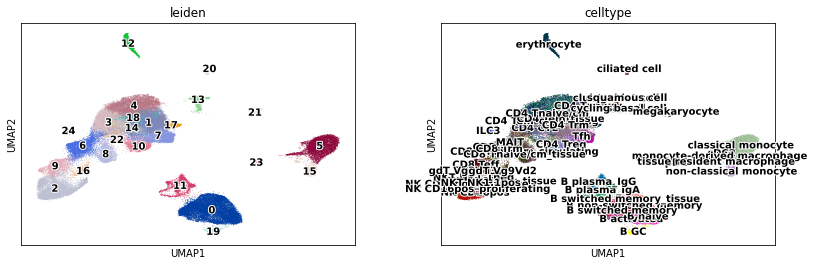

In [319]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x_b.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

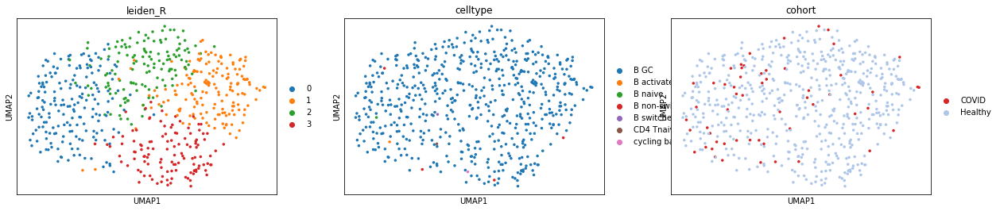

In [320]:
sc.tl.leiden(rna_x_g, key_added = 'leiden_R')
sc.pl.umap(rna_x_g, color=['leiden_R', 'celltype', 'cohort'], size=50)

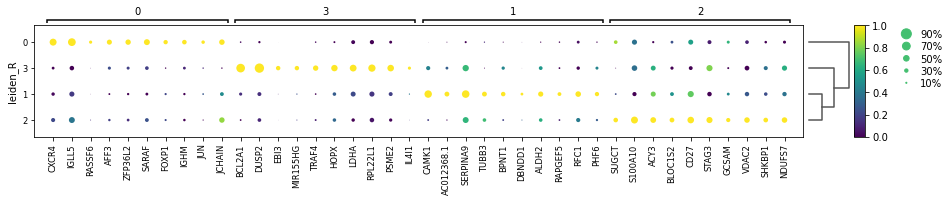

In [340]:
sc.tl.rank_genes_groups(rna_x_g, groupby = 'leiden_R')
sc.tl.filter_rank_genes_groups(rna_x_g, min_fold_change=1)
sc.tl.dendrogram(rna_x_g, groupby = 'leiden_R')
sc.pl.rank_genes_groups_dotplot(rna_x_g, n_genes = 10, standard_scale = 'var', color_map = 'viridis', key = 'rank_genes_groups_filtered')

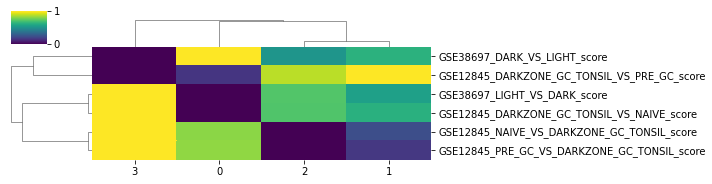

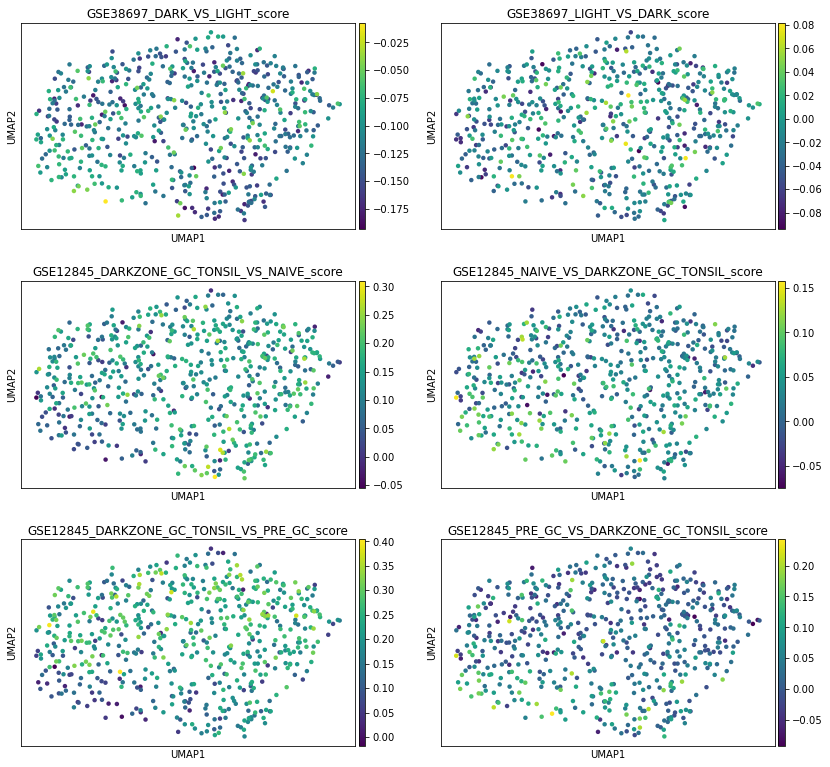

In [323]:
geneset_score(rna_x_g, df2, 'leiden_R', (10,2.5))

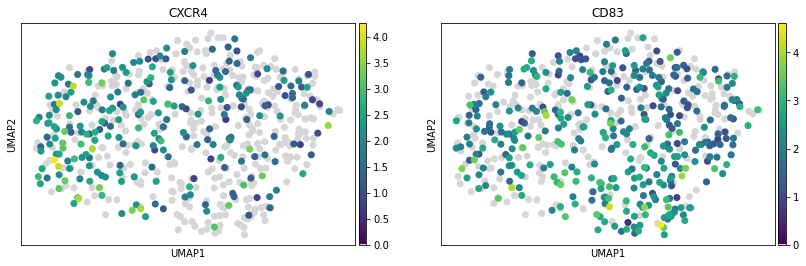

In [324]:
sc.pl.umap(rna_x_g, color = ['CXCR4', 'CD83'], color_map = newcmp)

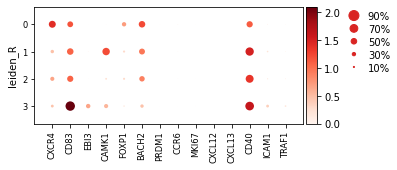

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.8999999999999995, 0, 0.2, 0.5, 0.25])

In [337]:
sc.pl.dotplot(rna_x_g, ['CXCR4', 'CD83', 'EBI3', 'CAMK1', 'FOXP1', 'BACH2', 'PRDM1', 'CCR6', 'MKI67', 'CXCL12', 'CXCL13', 'CD40', 'ICAM1', 'TRAF1'], groupby = 'leiden_R')

... storing 'celltype' as categorical


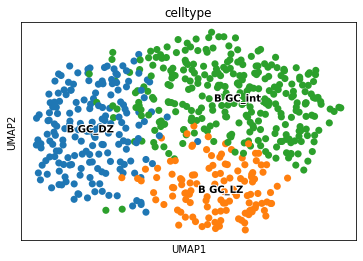

In [341]:
new_dict = {
    '0':'B GC_DZ',
    '1':'B GC_int',
    '2':'B GC_int',
    '3':'B GC_LZ'}
rna_x_g.obs['celltype'] = [new_dict[l] for l in rna_x_g.obs['leiden_R']]
sc.pl.umap(rna_x_g, color=['celltype'], legend_loc ='on data', legend_fontoutline=2)

... storing 'celltype' as categorical


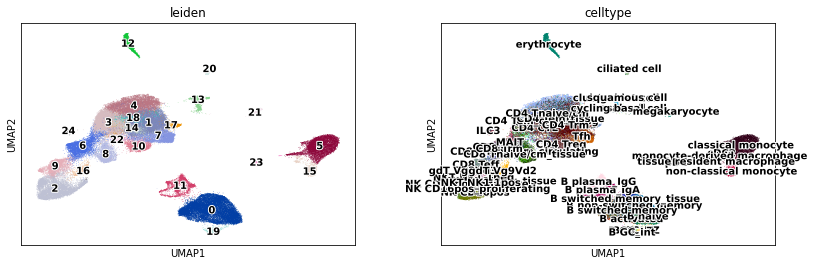

In [342]:
# update the original object
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(rna_x_g.obs['celltype'].astype('object'))
sc.pl.umap(adata, color = ['leiden', 'celltype'], legend_loc = 'on data', legend_fontoutline=2)

... storing 'main_celltype' as categorical


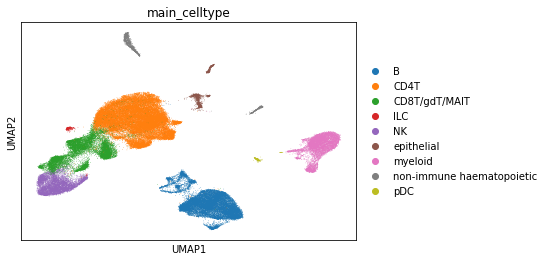

In [344]:
main_label = {'0':'B',
'1':'CD4T',
'2':'NK',
'3':'CD4T',
'4':'CD4T',
'5':'myeloid',
'6':'CD8T/gdT/MAIT',
'7':'CD4T',
'8':'CD8T/gdT/MAIT',
'9':'CD8T/gdT/MAIT',
'10':'CD4T',
'11':'B',
'12':'non-immune haematopoietic',
'13':'epithelial',
'14':'CD4T',
'15':'myeloid',
'16':'CD8T/gdT/MAIT',
'17':'CD4T',
'18':'CD4T',
'19':'B',
'20':'epithelial',
'21':'non-immune haematopoietic',
'22':'CD4T',
'23':'pDC',
'24':'ILC'}
adata.obs['main_celltype'] = [main_label[l] for l in adata.obs['leiden']]
sc.pl.umap(adata, color = ['main_celltype'])

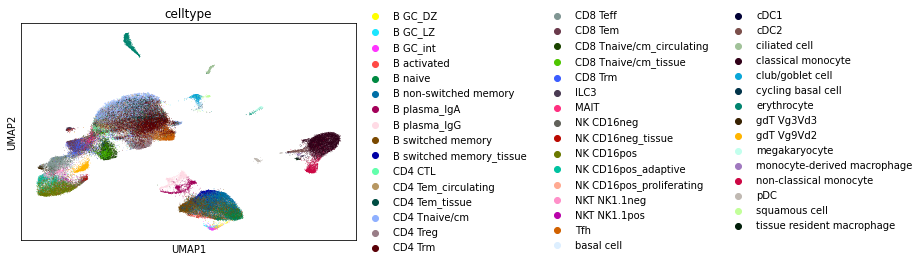

In [345]:
sc.pl.umap(adata, color = ['celltype'])

In [346]:
adata_ = adata.copy()
adata_

AnnData object with n_obs × n_vars = 80102 × 915
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [380]:
adata = sc.read_h5ad('out/adata_combined_v2.h5ad')
adata_raw = sc.read_h5ad('out/adata_combined_raw_v2.h5ad')
adata

AnnData object with n_obs × n_vars = 93971 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [348]:
adata.obs['celltype'] = adata.obs['celltype'].astype('object')
adata.obs['celltype'].update(adata_.obs['celltype'].astype('object'))
adata.obs['main_celltype'] = adata.obs['main_celltype'].astype('object')
adata.obs['main_celltype'].update(adata_.obs['main_celltype'].astype('object'))

In [381]:
adata.obs['leiden'] = adata.obs['leiden'].astype('object')
adata.obs['leiden'].update(adata_.obs['leiden'].astype('object'))

... storing 'leiden' as categorical


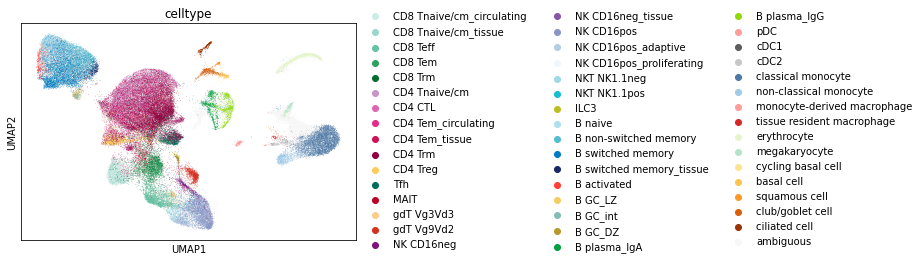

In [382]:
sc.pl.umap(adata, color = ['celltype'])

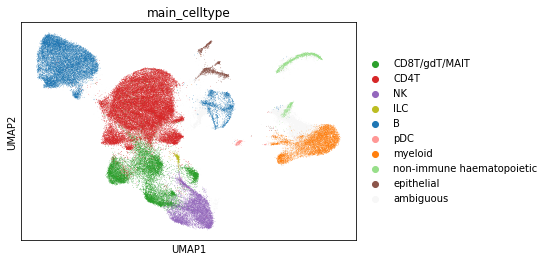

In [383]:
sc.pl.umap(adata, color = ['main_celltype'])

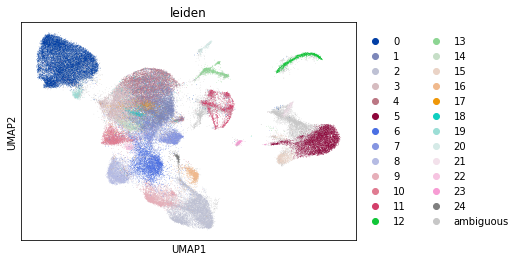

In [384]:
sc.pl.umap(adata, color = ['leiden'])

In [365]:
new_order = ['CD8 Tnaive/cm_circulating', 'CD8 Tnaive/cm_tissue', 'CD8 Teff', 'CD8 Tem', 'CD8 Trm',  'CD4 Tnaive/cm', 'CD4 CTL', 'CD4 Tem_circulating', 'CD4 Tem_tissue', 'CD4 Trm', 'CD4 Treg', 'Tfh', 'MAIT', 'gdT Vg3Vd3', 'gdT Vg9Vd2', 'NK CD16neg', 'NK CD16neg_tissue', 'NK CD16pos', 'NK CD16pos_adaptive', 'NK CD16pos_proliferating', 'NKT NK1.1neg', 'NKT NK1.1pos', 'ILC3', 'B naive', 'B non-switched memory', 'B switched memory', 'B switched memory_tissue',  'B activated', 'B GC_LZ', 'B GC_int', 'B GC_DZ', 'B plasma_IgA', 'B plasma_IgG', 'pDC', 'cDC1', 'cDC2', 'classical monocyte', 'non-classical monocyte', 'monocyte-derived macrophage', 'tissue resident macrophage', 'erythrocyte', 'megakaryocyte', 'cycling basal cell', 'basal cell', 'squamous cell', 'club/goblet cell', 'ciliated cell', 'ambiguous']
new_palette = ['#ccece6', '#99d8c9', '#66c2a4', '#2ca25f', '#006d2c', '#c994c7', '#df65b0', '#e7298a', '#ce1256', '#91003f', '#fecc5c', '#016c59', '#bd0026', '#fdcc8a', '#d7301f', '#810f7c', '#8856a7', '#8c96c6', '#b3cde3', '#edf8fb', '#9edae5', '#17becf', '#bcbd22', '#AFDFEF', '#54BCD1', '#007BC3', '#172869', '#FF3F38', '#F1CD63', '#86bcb6', '#B6992D', '#009F3F', '#8FDA04', '#ff9d9a', '#5c5c5c', '#c7c7c7', '#4e79a7', '#a0cbe8', '#ff9d9a', '#d62728', '#e6f5c9', '#b3e2cd', '#fee391', '#fec44f', '#fe9929', '#d95f0e', '#993404', '#f7f7f7']

In [366]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')
adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories(new_order)

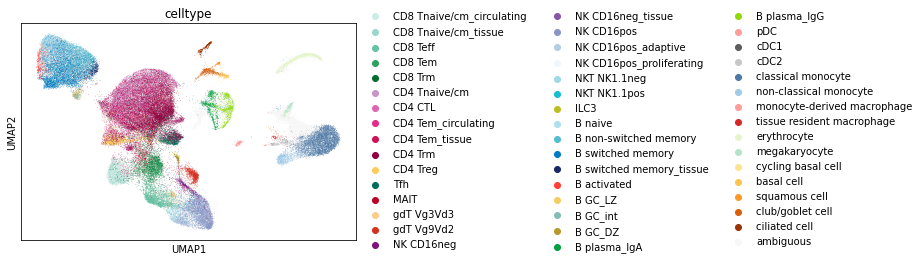

In [367]:
sc.pl.umap(adata, color = ['celltype'], palette = new_palette)

In [369]:
main_order = ['CD8T/gdT/MAIT','CD4T','NK', 'ILC', 'B','pDC','myeloid','non-immune haematopoietic','epithelial','ambiguous']
new_palette = ['#2ca02c', '#d62728', '#9467bd', '#BCBD22', '#1f77b4', '#ff9896', '#ff7f0e', '#98df8a', '#8c564b', '#f7f7f7']

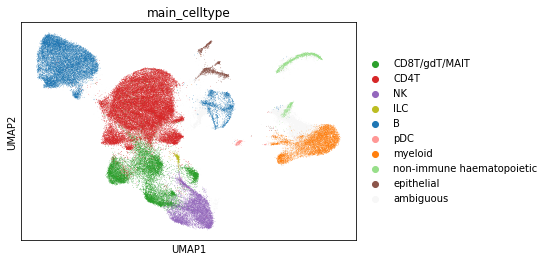

In [370]:
adata.obs['main_celltype'] = adata.obs['main_celltype'].cat.reorder_categories(main_order)
sc.pl.umap(adata, color = ['main_celltype'], palette = new_palette)

In [385]:
# save the file temporarily
adata_raw.obs = adata.obs.copy()
adata_raw.uns = adata.uns.copy()
adata.write('out/adata_combined_v2.h5ad', compression = 'gzip')
adata_raw.write('out/adata_combined_raw_v2.h5ad', compression = 'gzip')

In [386]:
adata.obs.to_csv('out/141020newmeta.csv')

In [387]:
adata = adata[~(adata.obs['celltype']=='ambiguous')]
adata

View of AnnData object with n_obs × n_vars = 80102 × 876
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Recluster

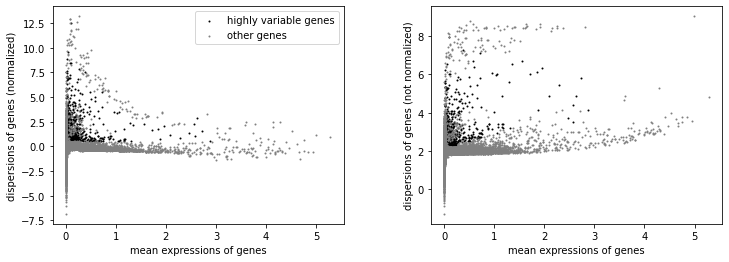

AnnData object with n_obs × n_vars = 80102 × 22498
    obs: 'sampleid', 'patient', 'sampletype', 'age_group', 'gender', 'cohort', 'batch', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'bh_pval', 'is_doublet', 'filter_rna', 'leiden', 'main_celltype', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cohort_colors', 'gender_colors', 'hvg', 'leiden', 'leiden_colors', 'main_celltype_colors', 'neighbors', 'patient_colors', 'pca', 'sampleid_colors', 'sampletype_colors', 'temp_label_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [388]:
adata = adata.raw.to_adata()
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
import re
for i in adata.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJ]', i):
        adata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(adata)
adata.raw = adata
adata

In [389]:
# subset to highly variable
adata = adata[:, adata.var['highly_variable']]
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value = 10)

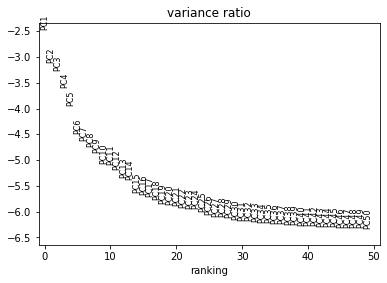

In [390]:
# Principal component analysis
sc.tl.pca(adata, svd_solver = 'arpack')
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

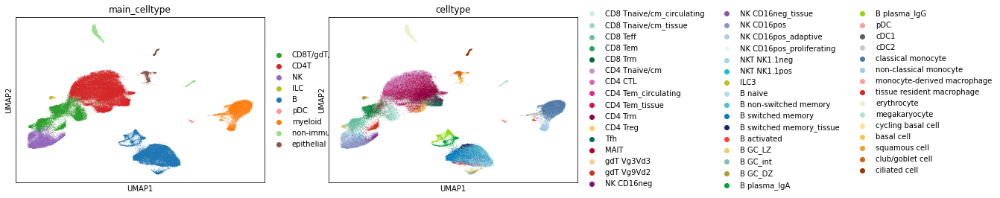

In [391]:
# run BBKNN
sc.external.pp.bbknn(adata, batch_key = 'patient')
# UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
sc.pl.umap(adata, color=['main_celltype', 'celltype'])

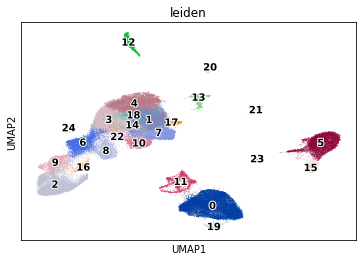

In [392]:
# find clusters
sc.pl.umap(adata, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

In [393]:
adata.write('out/adata_combined_filtered_v2.h5ad', compression = 'gzip')